In [33]:
#check packages
# !pip3 install tf-models-official==2.14.0
! pip3 list

Package                       Version
----------------------------- --------------------------------------------------------------
absl-py                       1.4.0
anyio                         4.0.0
argon2-cffi                   23.1.0
argon2-cffi-bindings          21.2.0
array_record                  0.5.1
arrow                         1.2.3
asttokens                     2.4.1
astunparse                    1.6.3
async-lru                     2.0.4
attrs                         23.1.0
Babel                         2.12.1
backcall                      0.2.0
beautifulsoup4                4.12.2
bleach                        6.0.0
blinker                       1.4
cachetools                    5.3.1
certifi                       2023.7.22
cffi                          1.15.1
charset-normalizer            3.2.0
click                         8.1.7
cloudpickle                   3.0.0
colorama                      0.4.6
coloredlogs                   15.0.1
comm                          0.

In [43]:
# ! pip install -q git+https://github.com/tensorflow/examples.git
# ! pip install tensorflow_datasets

# ! pip install pydot
import os
import tensorflow as tf
import numpy as np
import tensorflow.keras as keras
from tensorflow.keras import layers
from tensorflow import data as tf_data
import matplotlib.pyplot as plt
from keras.applications.mobilenet_v2 import MobileNetV2
from keras.applications.mobilenet_v2 import preprocess_input

import matplotlib.pyplot as plt
import os
from tensorflow_examples.models.pix2pix import pix2pix

from IPython.display import clear_output
import matplotlib.pyplot as plt
import zipfile as zf

# !pip uninstall opencv-python opencv-python-headless -y
# !pip install opencv-python-headless
import cv2


In [44]:
# os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"   # see issue #152 CODE TO MAKE IT USE CPU INSTEAD of GPU
# os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  # Restrict TensorFlow to only allocate 1GB of memory on the first GPU
  try:
    tf.config.set_logical_device_configuration(
        gpus[0],
        [tf.config.LogicalDeviceConfiguration(memory_limit=8*1024)])
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Virtual devices must be set before GPUs have been initialized
    print(e)

1 Physical GPUs, 1 Logical GPUs


In [ ]:
#if you need to extract zip files into folders
def extract_into_directory(zip_dir, final_dir):
    files = zf.ZipFile(zip_dir, 'r')
    files.extractall(final_dir)
    files.close()


In [45]:
import os 
import shutil

"""
INITIALIZING DATASETS:

Provide: 
- directory to images
- directory to corresponding masks -> Make sure masks are black and white images 
- make sure the names of the images and the masks is the same 

*** In Plant Village, the masks are just the original images with the background removed, so you need to do preprocessing ***

"""


plant_village = "../Samuel_Plant_Disease/datasets/PlantVillage"
village_zip = "../Samuel_Plant_Disease/PlantVillage.zip"

unlabeled_source = os.path.join(plant_village, 'dataset/color')
segmented_source = os.path.join(plant_village, 'dataset/segmented')
diverse_background_source = os.path.join(plant_village, 'dataset/diverse_background')
tomato_train_background_source = os.path.join(plant_village, 'dataset/tomato_background')

just_background_source = os.path.join(plant_village, 'dataset/just_background')

unlabeled_dir = os.path.join(plant_village, 'unlabeled')
segmented_dir = os.path.join(plant_village, 'segmented')
mask_dir = os.path.join(plant_village, 'masked')

plant_village = "../Samuel_Plant_Disease/datasets/PlantVillage"

real_plant_dir = os.path.join(plant_village, 'real_test_plants')
unlabeled_real_plant_dir = os.path.join(real_plant_dir, 'background')
masked_real_plant_dir = os.path.join(real_plant_dir, 'mask')


office_plant_dir = os.path.join(plant_village, 'office_plants')

#these are all the datasets that are from pictures taken in the office 
#originalbbox means that they were taken from leaves that were first detected with yolov8
office_plant_original_zip = os.path.join(office_plant_dir, 'original.zip')
office_plant_mask_zip = os.path.join(office_plant_dir, 'annotation.zip')

office_plant_original_dir = os.path.join(office_plant_dir, 'original')
office_plant_mask_dir = os.path.join(office_plant_dir, 'mask')

# extract_into_directory(office_plant_original_zip, office_plant_original_dir)
# extract_into_directory(office_plant_mask_zip, office_plant_mask_dir)

office_bbox_original_dir = os.path.join(office_plant_dir, 'originalbbox')
office_bbox_mask_dir = os.path.join(office_plant_dir, 'maskbbox')

#remove extraneous folders, such as .ipnyb folders

def remove_folders(parent_folder):
    for item in os.listdir(parent_folder):
        item_path = os.path.join(parent_folder, item)
        if os.path.isdir(item_path):
            shutil.rmtree(item_path)
            print(f"Removed folder: {item_path}")

remove_folders(unlabeled_real_plant_dir)
remove_folders(masked_real_plant_dir)

#preprocessing for plant village (basically converting the segmented images into black and white)
def preprocess_plant_village():
    mask_dir = os.path.join(plant_village, 'masked')
    if not os.path.exists(mask_dir):
        os.makedirs(mask_dir)
    # 確保兩個資料夾中的檔案數量相同
     #this code converts masks into black and white 
    # 處理每個圖像對
    for root, dirs, files in os.walk(segmented_dir):    
        for file in files:
            segmented_path = os.path.join(segmented_dir, file)
            # print(f"Masked: {segmented_path}")
            masked_image = cv2.imread(segmented_path)
            # 將黑色背景區域轉換為白色
            segmentation_mask = cv2.inRange(masked_image, (0, 0, 0), (20, 20, 20))  # 調整顏色閾值來確保只捕捉到黑色背景區域
            # 可選：進行形態學操作來改進分割掩碼的質量
            kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
            segmentation_mask = cv2.morphologyEx(segmentation_mask, cv2.MORPH_CLOSE, kernel)
            segmentation_mask = cv2.morphologyEx(segmentation_mask, cv2.MORPH_OPEN, kernel)
            # 保存分割掩碼
            new_path = os.path.join(mask_dir, file)
            cv2.imwrite(new_path, segmentation_mask)
            print(new_path)
            # print(f"Saved segmentation mask: {mask_filename}")




In [48]:
import re

#Incase the file names of a folder don't match
def make_sure_file_names_match():
    for filename in os.listdir(office_mask_dir):
        # Use regular expression to find the number after 'task-'
        match = re.search(r'task-(\d+)', filename)
        if match:
            # Extract the number and add a '0' to the beginning
            number = '0' + match.group(1)
            # Construct the new filename
            new_filename = f"{number}.png"  # Change the extension if needed
            # Get the full path for the old and new filenames
            old_filepath = os.path.join(office_mask_dir, filename)
            new_filepath = os.path.join(office_mask_dir, new_filename)
            # Rename the file
            os.rename(old_filepath, new_filepath)
            print(f"Renamed {old_filepath} to {new_filepath}")
        else:
            print(f"No match found for {filename}")

#add 0 to file name if it doesnt start with 0 
# for filename in os.listdir(office_original_dir):
#     # Check if the filename starts with a digit and if the first digit is not 0
#     match = re.match(r'^\d', filename)
#     if match and not filename.startswith('0'):
#         # Add a '0' to the beginning of the filename
#         new_filename = '0' + filename
#         # Get the full path for the old and new filenames
#         old_filepath = os.path.join(office_original_dir, filename)
#         new_filepath = os.path.join(office_original_dir, new_filename)
#         # Rename the file
#         os.rename(old_filepath, new_filepath)
#         print(f"Renamed {old_filepath} to {new_filepath}")


In [49]:
#Makes sure number of images in segmented and labeled dir is the same 

def count_images(directory):
    # Count the number of image files in the directory
    image_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.gif', '.tiff')
    return len([file for file in os.listdir(directory) if file.lower().endswith(image_extensions)])

def clean_unlabeled(unlabeled_dir, segmented_dir):
    for root, dirs, files in os.walk(unlabeled_dir, topdown=False):
        for dir in dirs:
            dir_path = os.path.join(root, dir)
            shutil.rmtree(dir_path)
    
    # Remove all folders inside segmented_dir
    for root, dirs, files in os.walk(segmented_dir, topdown=False):
        for dir in dirs:
            dir_path = os.path.join(root, dir)
            shutil.rmtree(dir_path)
    unlabeled_files = os.listdir(unlabeled_dir)
    # Get list of files in segmented_dir
    segmented_files = os.listdir(segmented_dir)
    
    # Convert segmented_files to a set for faster lookup
    segmented_set = set(segmented_files)
    unlabeled_set = set(unlabeled_files)

    # Print the first item in segmented_set
    first_segmented_item = next(iter(segmented_set), None)


    num_exists = 0

    
    for file_name in unlabeled_files:
        file_path = os.path.join(unlabeled_dir, file_name)
        # Check if the file exists in segmented_dir
        if not file_name in segmented_set:
           os.remove(file_path)
    for file_name in segmented_files:
        file_path = os.path.join(segmented_dir, file_name)
        # Check if the file exists in segmented_dir
        if not file_name in unlabeled_set:
           os.remove(file_path)

clean_unlabeled(unlabeled_dir, segmented_dir)
print("Unlabeled Image Count: " + str(count_images(unlabeled_dir)))
print("Labeled Image Count: " + str(count_images(segmented_dir)))
                                                                                                                         

Unlabeled Image Count: 53107
Labeled Image Count: 53107


Mask DiR: 53107
Diverse Background: 2353
Unlabeled Dir: 53107
Segmented Dir: 53107
4


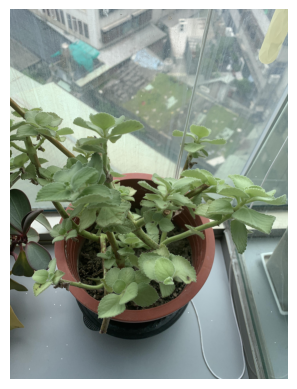

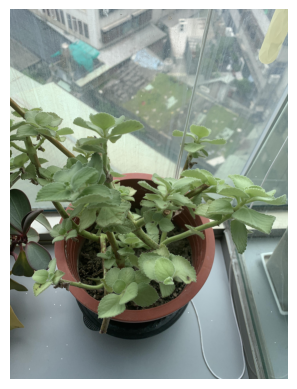

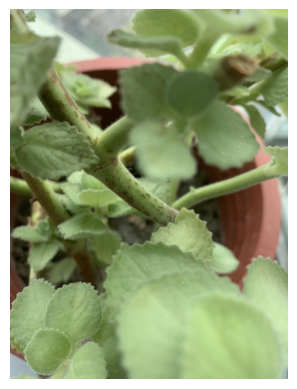

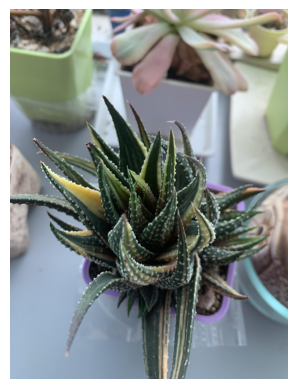

In [51]:
import os
from PIL import Image
import matplotlib.pyplot as plt

#check counts for everything
print("Mask DiR: " + str(count_images(mask_dir)))
print("Diverse Background: " + str(count_images(diverse_background_source)))

segmented_dir = mask_dir

print("Unlabeled Dir: " + str(count_images(unlabeled_dir)))
print("Segmented Dir: " + str(count_images(segmented_dir)))

image_files = [file for file in os.listdir(unlabeled_real_plant_dir) if file.endswith(('png', 'jpg', 'jpeg'))]
print(len(image_files))
for image_file in image_files:
    image_path = os.path.join(unlabeled_real_plant_dir, image_file)
    image = Image.open(image_path)
    # image = image.rotate(270, expand=True)
    plt.figure()  # Create a new figure for each image
    plt.imshow(image)
    plt.axis('off')  # Hide the axis
    plt.show()
    image.save(image_path)



In [52]:
#define functions for loading in images, datasets, doing processing 
img_height = 128
img_width = 128
import random

def normalize(input_image, input_mask):
  input_image = tf.cast(input_image, tf.float32) / 255.0
  input_mask -= 1
  return input_image, input_mask

def normalize_img(image, label):
  """Normalizes images: `uint8` -> `float32`."""
  return tf.cast(image, tf.float32) / 255., label


# def load_image(image, segmentation_mask):
#     input_image = tf.image.resize(image, (128, 128))

#     input_mask = tf.image.resize(segmentation_mask, (128, 128), method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
#     input_image, input_mask = normalize(input_image, input_mask)

#     return input_image, input_mask
# def adjust_random_contrast(image):
#     contrast_factor = tf.random.uniform([], minval=0.1, maxval=1.2)
#     return tf.image.adjust_contrast(image, contrast_factor)

from tensorflow.keras.preprocessing.image import load_img, img_to_array

def random_background(mask, original_image):
    image = original_image.copy()
    non_zero_mask = np.broadcast_to(mask == 1, image.shape)
    
    height, width, _ = image.shape
    random_shades = np.zeros((height, width, 3), dtype=np.float32)
    
    # Randomly choose between red, green, or blue
    choice = np.random.choice([0, 1, 2])
    choice = 2
    # Apply the random shades to the non-zero mask pixels
    image[non_zero_mask[:, :, 0], 0] =  0 #np.random.uniform(0, 1) #if choice == 0 else 0
    image[non_zero_mask[:, :, 1], 1] = np.random.uniform(0, 1) #if choice == 1 else 0
    image[non_zero_mask[:, :, 2], 2] = 0 # np.random.uniform(0, 1) #if choice == 2 else 0
    return image
    
def adjust_random_hue(image):
    hue_delta = tf.random.uniform([], minval=-0.2, maxval=0.2)  # Adjust the range as needed
    return tf.image.adjust_hue(image, hue_delta)
    
def load_image(image_path, mask_path):
    image_path = image_path.numpy().decode('utf-8')
    mask_path = mask_path.numpy().decode('utf-8')
    
    image = load_img(image_path, target_size=(img_height, img_width))
    image = img_to_array(image) / 255.0
    
    mask = load_img(mask_path, target_size=(img_height, img_width), color_mode="grayscale")
    mask = img_to_array(mask) / 255.0
    return image, mask

def load_just_background_image(image_path, mask_path):
    image_path = image_path.numpy().decode('utf-8')
    
    image = load_img(image_path, target_size=(img_height, img_width))
    image = img_to_array(image) / 255.0
    
    height, width, _ = image.shape
    mask = np.zeros((height, width, 1), dtype=np.float32)
    mask = 1 - mask
    return image, mask


def load_image_with_random_background(image_path, mask_path):
    image_path = image_path.numpy().decode('utf-8')
    mask_path = mask_path.numpy().decode('utf-8')
    
    image = load_img(image_path, target_size=(img_height, img_width))
    image = img_to_array(image) / 255.0
    
    mask = load_img(mask_path, target_size=(img_height, img_width), color_mode="grayscale")
    mask = img_to_array(mask) / 255.0

    image = random_background(mask, image)

    return image, mask
    

def load_image_inverted_mask(image_path, mask_path):
    image_path = image_path.numpy().decode('utf-8')
    mask_path = mask_path.numpy().decode('utf-8')
    
    image = load_img(image_path, target_size=(img_height, img_width))
    image = img_to_array(image) / 255.0
    
    mask = load_img(mask_path, target_size=(img_height, img_width), color_mode="grayscale")
    mask = img_to_array(mask) / 255.0
    mask = 1 - mask
    return image, mask

def load_dataset_just_background(image_folder, mask_folder):
    image_paths = sorted([os.path.join(image_folder, fname) for fname in os.listdir(image_folder)])
    mask_paths = sorted([os.path.join(mask_folder, fname) for fname in os.listdir(mask_folder)])

    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    
    def process_path(image_path, mask_path):
        image, mask = tf.py_function(load_just_background_image, [image_path, mask_path], [tf.float32, tf.float32])
        image.set_shape([img_height, img_width, 3])
        image = tf.image.random_brightness(image, 0.2)
        image = tf.image.random_contrast(image, 0.8, 1.2)
        image = tf.image.random_saturation(image, 0.75, 1.25)
        image = tf.image.random_hue(image, 0.15)
        mask.set_shape([img_height, img_width, 1])
        return image, mask
    
    dataset = dataset.map(process_path, num_parallel_calls=tf.data.AUTOTUNE)
    return dataset

def load_dataset_random_background(image_folder, mask_folder):
    image_paths = sorted([os.path.join(image_folder, fname) for fname in os.listdir(image_folder)])
    mask_paths = sorted([os.path.join(mask_folder, fname) for fname in os.listdir(mask_folder)])
    
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    
    def process_path(image_path, mask_path):
        image, mask = tf.py_function(load_image_with_random_background, [image_path, mask_path], [tf.float32, tf.float32])
        image.set_shape([img_height, img_width, 3])
        image = tf.image.random_brightness(image, 0.2)
        image = tf.image.random_contrast(image, 0.8, 1.2)
        image = tf.image.random_saturation(image, 0.75, 1.25)
        image = tf.image.random_hue(image, 0.15)
        mask.set_shape([img_height, img_width, 1])
        return image, mask
    
    dataset = dataset.map(process_path, num_parallel_calls=tf.data.AUTOTUNE)
    return dataset

def load_dataset(image_folder, mask_folder):
    image_paths = sorted([os.path.join(image_folder, fname) for fname in os.listdir(image_folder)])
    mask_paths = sorted([os.path.join(mask_folder, fname) for fname in os.listdir(mask_folder)])
    
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    
    def process_path(image_path, mask_path):

        image, mask = tf.py_function(load_image, [image_path, mask_path], [tf.float32, tf.float32])
        image.set_shape([img_height, img_width, 3])
        mask.set_shape([img_height, img_width, 1])
        image = tf.image.random_brightness(image, 0.2)
        image = tf.image.random_contrast(image, 0.8, 1.2)
        image = tf.image.random_saturation(image, 0.75, 1.05)
        image = tf.image.random_hue(image, 0.15)
        return image, mask
    
    dataset = dataset.map(process_path, num_parallel_calls=tf.data.AUTOTUNE)
    return dataset

def load_dataset_mask_inverted(image_folder, mask_folder):
    image_paths = sorted([os.path.join(image_folder, fname) for fname in os.listdir(image_folder)])
    mask_paths = sorted([os.path.join(mask_folder, fname) for fname in os.listdir(mask_folder)])
    
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    
    def process_path(image_path, mask_path):
        image, mask = tf.py_function(load_image_inverted_mask, [image_path, mask_path], [tf.float32, tf.float32])
        image.set_shape([img_height, img_width, 3])
        image = tf.image.random_brightness(image, 0.2)
        image = tf.image.random_contrast(image, 0.8, 1.2)
        image = tf.image.random_saturation(image, 0.75, 1.05)
        image = tf.image.random_hue(image, 0.15)
        mask.set_shape([img_height, img_width, 1])
        return image, mask
    
    dataset = dataset.map(process_path, num_parallel_calls=tf.data.AUTOTUNE)
    return dataset

#makes sure there aren't folders inside a folder path 
def remove_directories(folder_path):
    """
    Remove all directories inside the given folder.

    Args:
    folder_path (str): Path to the folder where subdirectories need to be removed.
    """
    if not os.path.exists(folder_path):
        print(f"The folder {folder_path} does not exist.")
        return

    for item in os.listdir(folder_path):
        item_path = os.path.join(folder_path, item)
        if os.path.isdir(item_path):
            shutil.rmtree(item_path)
            print(f"Removed directory: {item_path}")
        else:
            print(f"Skipping file: {item_path}")


In [53]:

#augmentations for the datasets

class Augment(tf.keras.layers.Layer):
  def __init__(self, seed=42):
    super().__init__()
    # both use the same seed, so they'll make the same random changes.
    self.augment_inputs = tf.keras.layers.RandomFlip(mode="horizontal", seed=seed)
    self.augment_labels = tf.keras.layers.RandomFlip(mode="horizontal", seed=seed)


  def call(self, inputs, labels):
    inputs = self.augment_inputs(inputs)
    labels = self.augment_labels(labels)
    return inputs, labels

        
class MoreAugment(tf.keras.layers.Layer):
    def __init__(self, seed=42):
        super().__init__()
        # both use the same seed, so they'll make the same random changes.
        self.augment_inputs = tf.keras.Sequential([
            tf.keras.layers.RandomFlip(mode="horizontal", seed=seed),
            tf.keras.layers.RandomRotation(0.8, seed=seed),
            tf.keras.layers.RandomTranslation(height_factor=0.3, width_factor=0.3, seed=seed),
            tf.keras.layers.RandomContrast(factor=0.8, seed=seed),
            # ToBlackAndWhite()
        ])
        
        # Define augmentations for labels
        self.augment_labels = tf.keras.Sequential([
            tf.keras.layers.RandomFlip(mode="horizontal", seed=seed),
            tf.keras.layers.RandomRotation(0.8, seed=seed),
            tf.keras.layers.RandomTranslation(height_factor=0.3, width_factor=0.3, seed=seed),
            # ToBlackAndWhite()
        ])

    def call(self, inputs, labels):
        inputs = self.augment_inputs(inputs)
        labels = self.augment_labels(labels)
        return inputs, labels
        
class LessAugment(tf.keras.layers.Layer):
    def __init__(self, seed=42):
        super().__init__()
        # both use the same seed, so they'll make the same random changes.
        self.augment_inputs = tf.keras.Sequential([
            tf.keras.layers.RandomFlip(mode="horizontal", seed=seed),
            tf.keras.layers.RandomRotation(0.8, seed=seed),
            tf.keras.layers.RandomTranslation(height_factor=0.3, width_factor=0.3, seed=seed),
            tf.keras.layers.RandomContrast(factor=0.8, seed=seed),
            # ToBlackAndWhite()
        ])
        
        # Define augmentations for labels
        self.augment_labels = tf.keras.Sequential([
            tf.keras.layers.RandomFlip(mode="horizontal", seed=seed),
            tf.keras.layers.RandomRotation(0.8, seed=seed),
            tf.keras.layers.RandomTranslation(height_factor=0.3, width_factor=0.3, seed=seed),
            tf.keras.layers.RandomContrast(factor=0.8, seed=seed)
            # ToBlackAndWhite()
        ])
    
    def call(self, inputs, labels):
        inputs = self.augment_inputs(inputs)
        labels = self.augment_labels(labels)
        return inputs, labels     


In [55]:
#load all of the datasets in 

'''
This is the code for loading in all of the datasets, performing augmentations on the data, and then 
batching them into size of 32 or 64 for training. 

Usually I use PlantVillage train_batches for the first round of training, then finetune_train_batches for model finetuning
TYpically I skip the first round of training and just load in "not_finetuned.keras" and perform finetuning on it. 
'''

dataset = load_dataset(unlabeled_dir, segmented_dir)
random_background_dataset = load_dataset_random_background(unlabeled_dir, segmented_dir)

total_train_size = len(dataset)
train_size = int(len(dataset) * 0.8)
BATCH_SIZE = 64
batch_size = 64

BATCH_SIZE = 64
BUFFER_SIZE = 1000

fine_tune_train_size = total_train_size - train_size


#dataset used for training segmentation model 
train_dataset = dataset.take(train_size)  # 取前 train_size 条作为训练集
# train_dataset = train_dataset.map(normalize_img)
train_batches = (
    train_dataset  
        .cache()
        .shuffle(BUFFER_SIZE)
        .batch(batch_size)
        .repeat()
        .map(Augment())
        .prefetch(buffer_size=tf.data.AUTOTUNE))


random_background_dataset = random_background_dataset.take(10000)
random_batches = (
    random_background_dataset  
        .cache()
        .shuffle(BUFFER_SIZE)
        .batch(batch_size)
        .repeat()
        .map(Augment())
        .prefetch(buffer_size=tf.data.AUTOTUNE))

num_repeats = 300

# Function to repeat the dataset multiple times
def repeat_dataset(dataset, num_repeats):
    return tf.data.Dataset.range(num_repeats).flat_map(lambda _: dataset)
total_office_bbox_dataset = load_dataset_mask_inverted(office_bbox_original_dir, office_bbox_mask_dir)
office_bbox_dataset = repeat_dataset(total_office_bbox_dataset.take(int(0.8 * len(total_office_bbox_dataset))), 100)
                                     
office_bbox_dataset_val = total_office_bbox_dataset.skip(int(0.8 * len(total_office_bbox_dataset)))
office_bbox_dataset_val = total_office_bbox_dataset.take(len(total_office_bbox_dataset) - int(0.8 * len(total_office_bbox_dataset)))

office_bbox_batches = office_bbox_dataset.batch(batch_size)
office_bbox_batches = (
    office_bbox_dataset
    # repeat_dataset(office_dataset, 500)
        .cache()
        .shuffle(BUFFER_SIZE)
        .batch(batch_size)
        .repeat()
        .map(Augment())
        .prefetch(buffer_size=tf.data.AUTOTUNE))

office_bbox_val_batches = (
    office_bbox_dataset_val
    # repeat_dataset(office_dataset, 500)
        .cache()
        .shuffle(BUFFER_SIZE)
        .batch(batch_size)
        .repeat()
        .map(Augment())
        .prefetch(buffer_size=tf.data.AUTOTUNE))

office_dataset = repeat_dataset(load_dataset_mask_inverted(office_original_dir, office_mask_dir), 500)
office_batches = office_dataset.batch(batch_size)
office_batches = (
    office_dataset
    # repeat_dataset(office_dataset, 500)
        .cache()
        .shuffle(BUFFER_SIZE)
        .batch(batch_size)
        .repeat()
        .map(Augment())
        .prefetch(buffer_size=tf.data.AUTOTUNE))



just_background_dataset = load_dataset_just_background(just_background_source, just_background_source)
just_background_batches = (
    # just_background_dataset
    repeat_dataset(just_background_dataset, num_repeats)
        .cache()
        .shuffle(BUFFER_SIZE)
        .batch(batch_size)
        .repeat()
        .map(MoreAugment())
        .prefetch(buffer_size=tf.data.AUTOTUNE))

# combined_batches = train_with_random_dataset  
#         .cache()
#         .shuffle(BUFFER_SIZE)
#         .batch(batch_size)
#         .repeat()
#         .map(Augment())
#         .prefetch(buffer_size=tf.data.AUTOTUNE))

finetuning_dataset = (train_dataset.take(20000)).concatenate(random_background_dataset)
finetuning_dataset = finetuning_dataset.concatenate(office_bbox_batches.unbatch().take(6000))

finetune_train_batches = (
    finetuning_dataset 
        .cache()
        .shuffle(BUFFER_SIZE)
        .batch(batch_size)
        .repeat()
        .map(Augment())
        .prefetch(buffer_size=tf.data.AUTOTUNE))
# print(len(finetuning_dataset))

TRAIN_LENGTH = tf.data.experimental.cardinality(train_dataset).numpy()
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

# print("IMAGE SHAPE")
# for images, labels in train_dataset.unbatch().take(4):
#     for image in images:
#         print(image.shape)

#training dataset but with more augmentations 
aug_train_batches = (
    train_dataset  
        .cache()
        .shuffle(BUFFER_SIZE)
        .batch(batch_size)
        .repeat()
        # .map(Augment())
        .map(MoreAugment())
        .prefetch(buffer_size=tf.data.AUTOTUNE))


#generic test_dataset from taking 20% of the entire dataset
test_dataset = dataset.skip(train_size) 
test_dataset = dataset.take(len(dataset) - train_size)
# test_dataset = test_dataset.map(normalize_img)
test_batches = test_dataset.batch(batch_size)

#mostly from plant doc with background 
diverse_background_dataset = load_dataset(diverse_background_source, diverse_background_source)
diverse_background_ds = diverse_background_dataset.take(len(diverse_background_dataset))
# diverse_background_ds = diverse_background_ds.map(normalize_img)
diverse_background_batches = diverse_background_ds.batch(32)

#taiwan tomato dataset without removed background 
tomato_background_dataset = load_dataset(tomato_train_background_source, tomato_train_background_source)
tomato_background_ds = tomato_background_dataset.take(len(tomato_background_dataset))
# tomato_background_ds = tomato_background_ds.map(normalize_img)
tomato_background_batches = tomato_background_ds.batch(32)

#real plant dataset
remove_folders(unlabeled_real_plant_dir)
remove_folders(masked_real_plant_dir)

real_background_dataset = load_dataset_mask_inverted(unlabeled_real_plant_dir, masked_real_plant_dir)
real_background_ds = real_background_dataset.take(len(real_background_dataset))
# real_background_ds = real_background_ds.map(normalize_img)
real_background_batches = real_background_ds.batch(4)


print(len(finetuning_dataset))
print(len(total_office_bbox_dataset))




36000
838


In [56]:
#displays the input image, with the predicted mask 
def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    if(i < len(title)):
        plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

In [57]:
'''
This method takes in the mask for an image, the image, and draws the image with the mask removed
'''

def no_background_image(mask, image, original_image): #image should be of shape 160, 160, 3
    # print("APPLY THE MASK")
    original_image = np.array(original_image)    
    # Boolean mask to identify non-zero values in the mask
    non_zero_mask = np.broadcast_to(mask == 1, image.shape)

    
    # Assign corresponding colors from original image to new image where mask is non-zero

    original_image[non_zero_mask] = 0.0 #random.uniform(0.0, 200.0) #random number between black to gray  0.0 # original_image[non_zero_mask]
    # print("Original Image IS: ")
    # print(original_image)
    return original_image

In [58]:
#creates the mask for the image from model2.predict()
def create_mask(pred_mask):
  pred_mask = tf.math.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

RUNNING
tf.Tensor(
[[[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 ...

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


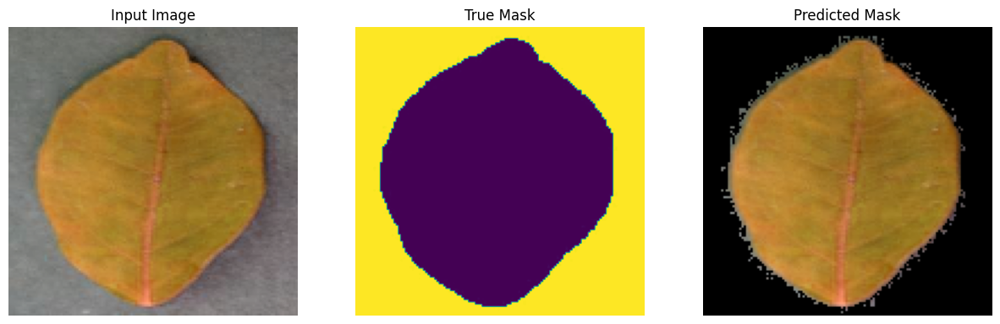

tf.Tensor(
[[[1.        ]
  [1.        ]
  [1.        ]
  ...
  [1.        ]
  [1.        ]
  [1.        ]]

 [[1.        ]
  [1.        ]
  [1.        ]
  ...
  [1.        ]
  [1.        ]
  [1.        ]]

 [[1.        ]
  [1.        ]
  [1.        ]
  ...
  [1.        ]
  [1.        ]
  [1.        ]]

 ...

 [[0.00392157]
  [0.        ]
  [0.        ]
  ...
  [1.        ]
  [1.        ]
  [1.        ]]

 [[0.99215686]
  [1.        ]
  [1.        ]
  ...
  [1.        ]
  [1.        ]
  [1.        ]]

 [[0.9882353 ]
  [1.        ]
  [1.        ]
  ...
  [1.        ]
  [1.        ]
  [1.        ]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


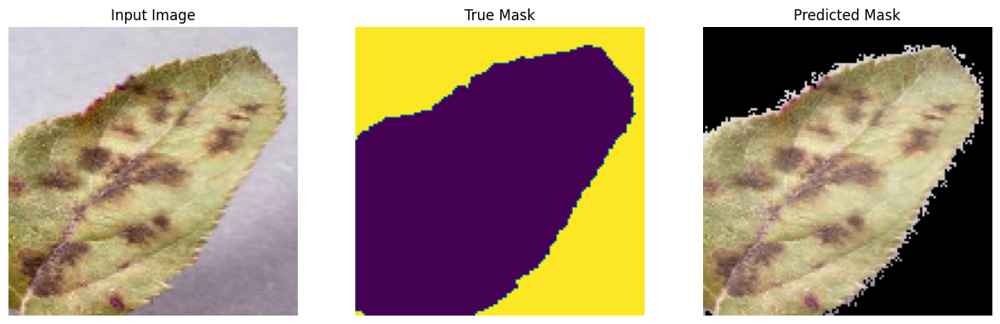

tf.Tensor(
[[[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 ...

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


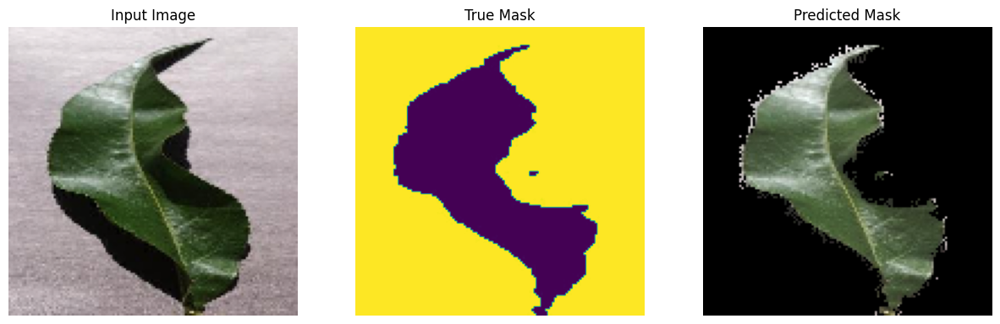

tf.Tensor(
[[[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 ...

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


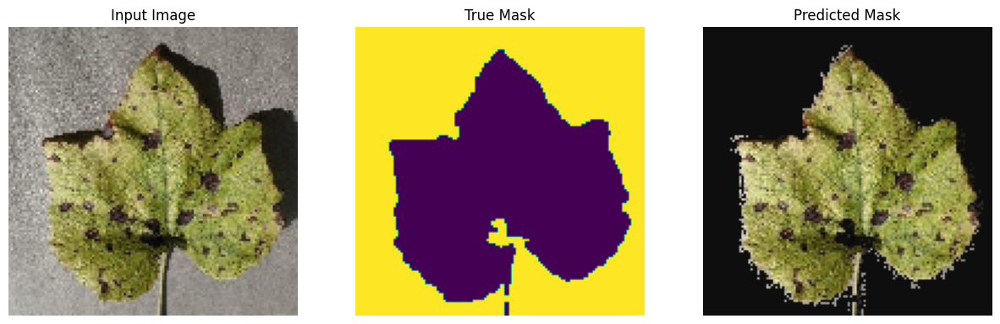

tf.Tensor(
[[[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 ...

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


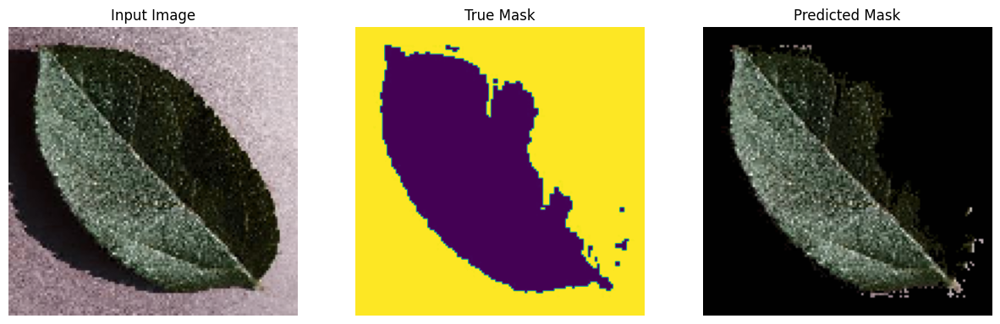

tf.Tensor(
[[[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 ...

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


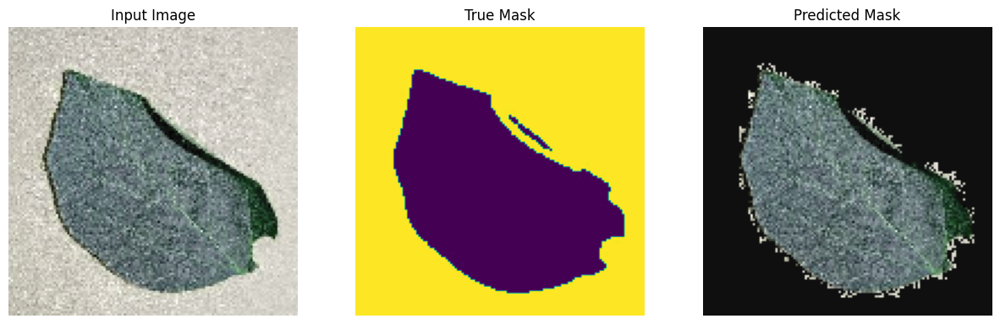

tf.Tensor(
[[[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 ...

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


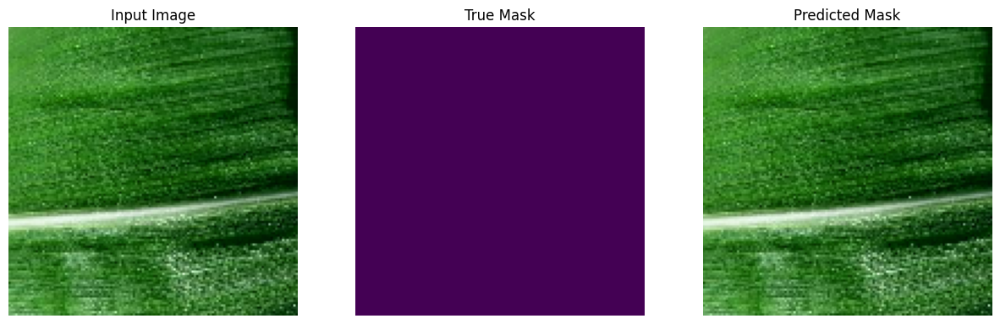

tf.Tensor(
[[[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 ...

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


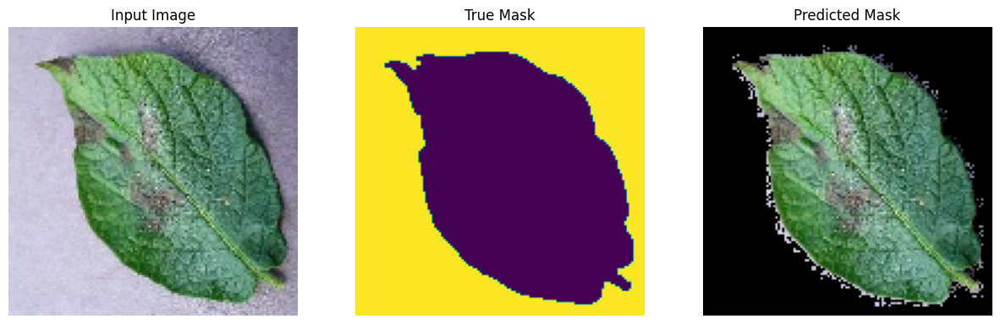

tf.Tensor(
[[[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 ...

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


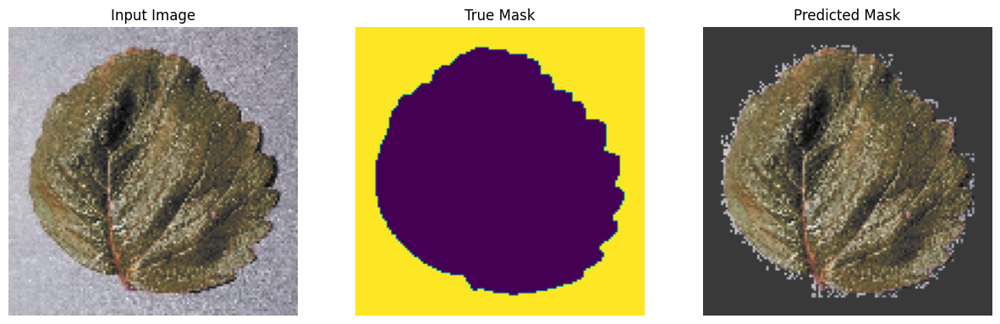

tf.Tensor(
[[[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 ...

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


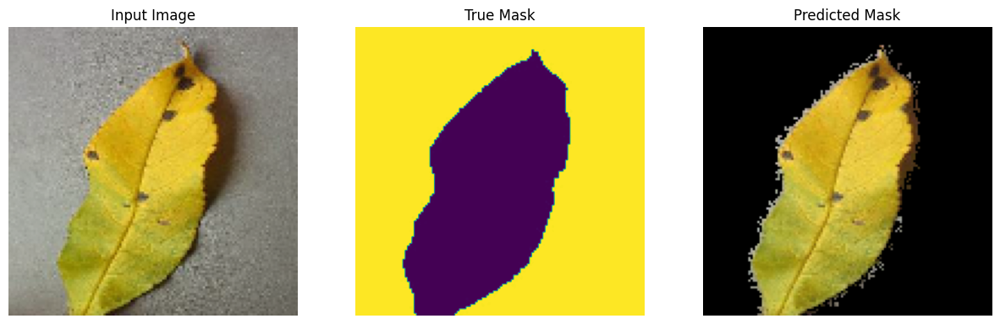

tf.Tensor(
[[[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 ...

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


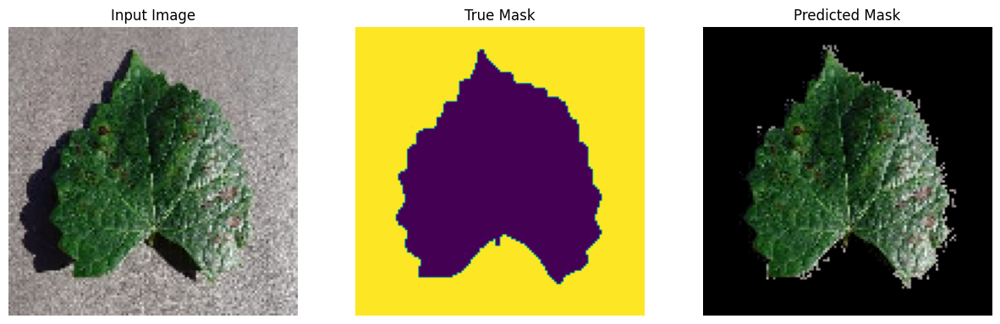

tf.Tensor(
[[[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 ...

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


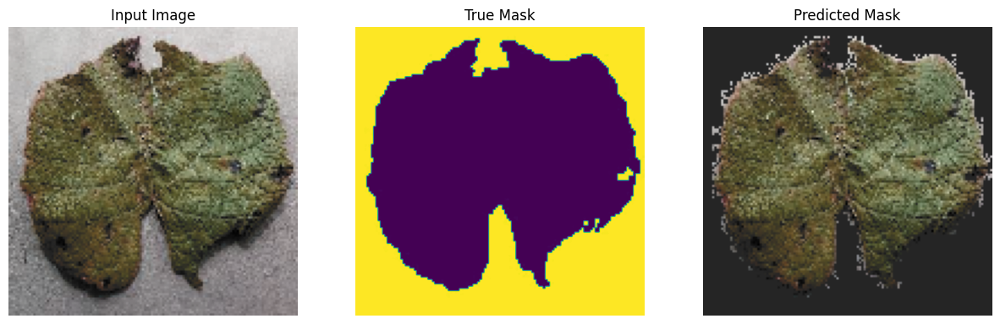

tf.Tensor(
[[[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 ...

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


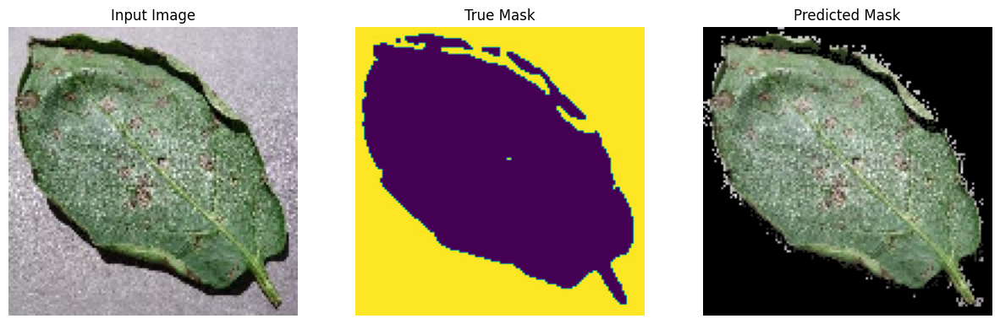

tf.Tensor(
[[[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 ...

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


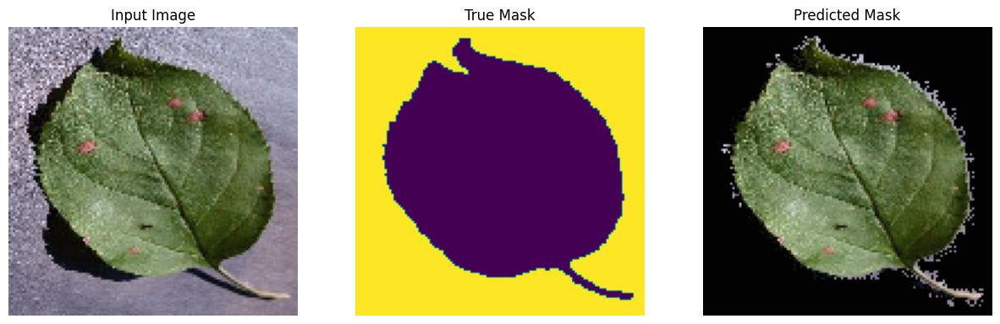

tf.Tensor(
[[[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 ...

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


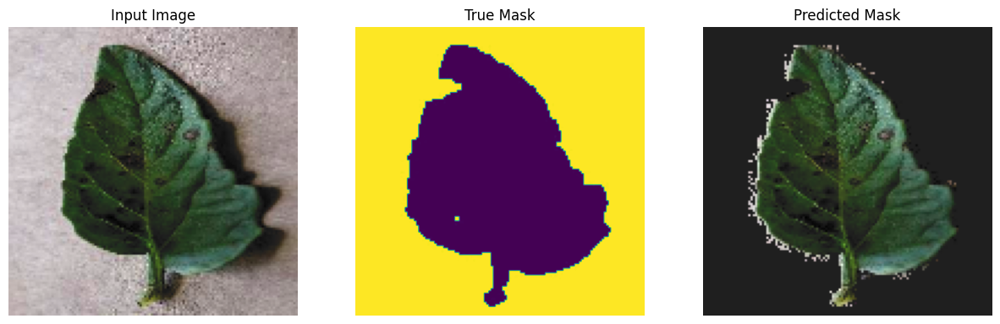

tf.Tensor(
[[[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 ...

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


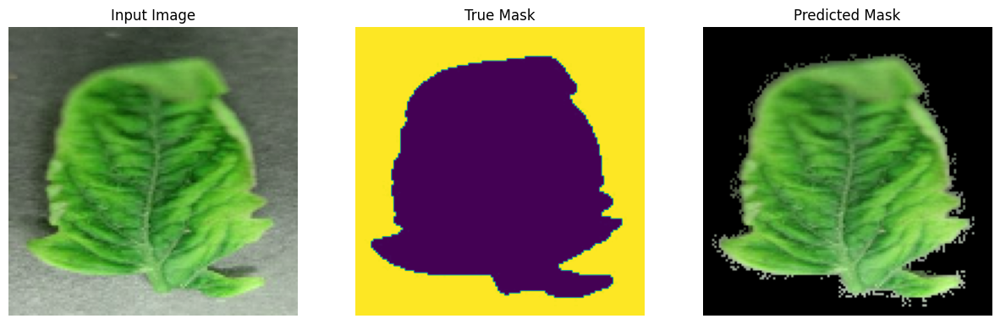

tf.Tensor(
[[[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 ...

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


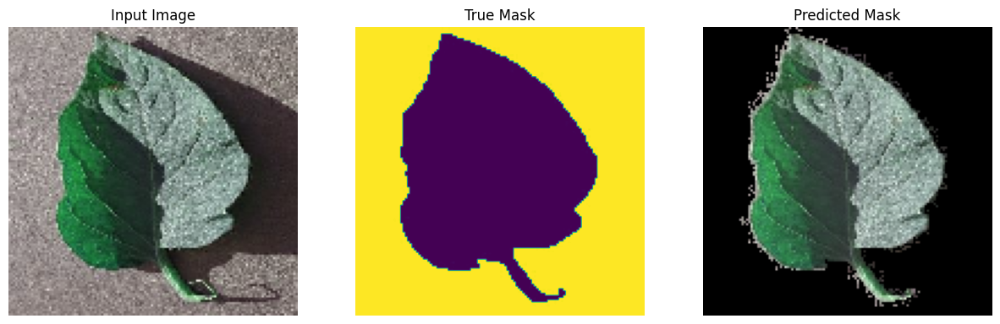

tf.Tensor(
[[[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 ...

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


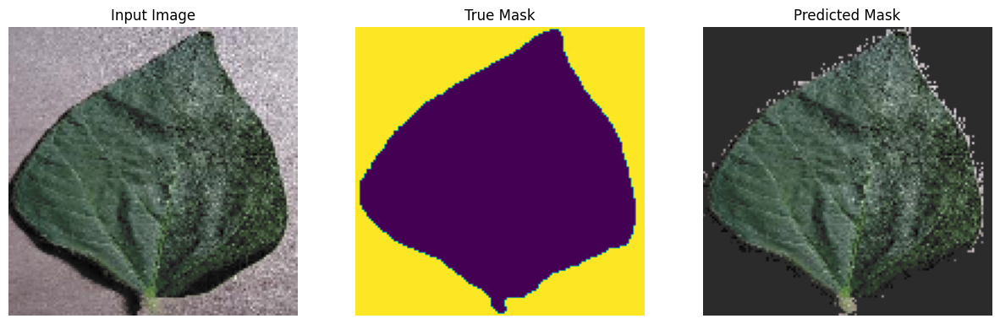

tf.Tensor(
[[[1.        ]
  [1.        ]
  [1.        ]
  ...
  [1.        ]
  [1.        ]
  [1.        ]]

 [[1.        ]
  [1.        ]
  [1.        ]
  ...
  [1.        ]
  [1.        ]
  [1.        ]]

 [[1.        ]
  [1.        ]
  [1.        ]
  ...
  [1.        ]
  [1.        ]
  [1.        ]]

 ...

 [[1.        ]
  [1.        ]
  [1.        ]
  ...
  [0.        ]
  [0.        ]
  [0.00392157]]

 [[1.        ]
  [1.        ]
  [1.        ]
  ...
  [0.        ]
  [0.        ]
  [0.        ]]

 [[1.        ]
  [1.        ]
  [1.        ]
  ...
  [0.        ]
  [0.        ]
  [0.        ]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


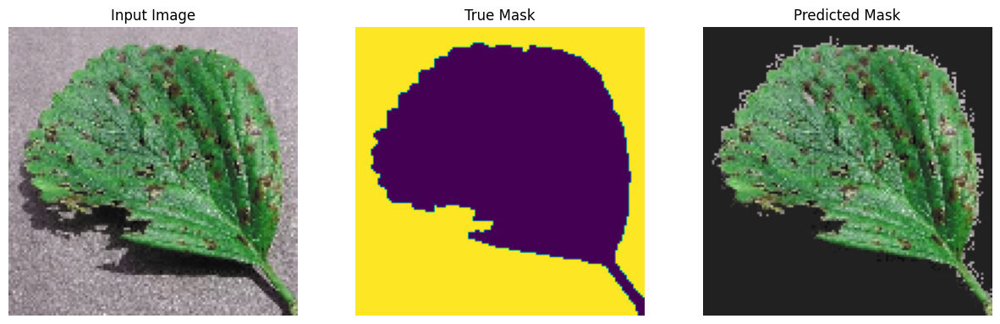

tf.Tensor(
[[[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 ...

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]

 [[1.]
  [1.]
  [1.]
  ...
  [1.]
  [1.]
  [1.]]], shape=(128, 128, 1), dtype=float32)
DISPLAY BRUH


2024-08-14 09:38:30.653821: W tensorflow/core/kernels/data/cache_dataset_ops.cc:854] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


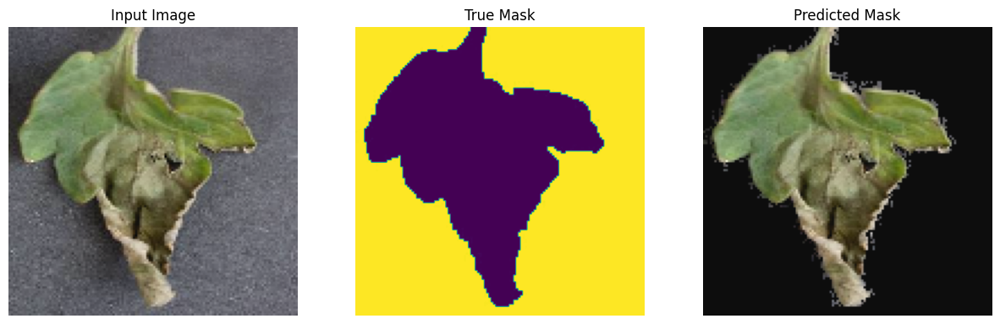

In [59]:
'''
Use this to make sure that your dataset masks and images appear correctly.

'''
i = 0
print("RUNNING")
image_folder = office_bbox_original_dir
mask_folder = office_bbox_mask_dir
for images, masks in train_batches.unbatch().take(20):
      sample_image, sample_mask = images, masks
      display([sample_image, sample_mask, no_background_image(sample_mask, sample_image, sample_image)])

# image_paths = sorted([os.path.join(image_folder, fname) for fname in os.listdir(image_folder)])
# mask_paths = sorted([os.path.join(mask_folder, fname) for fname in os.listdir(mask_folder)])

# dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
# for image, mask in zip(image_paths, mask_paths):
#     print(image)
#     sample_image = cv2.imread(image)
#     sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)
#     sample_mask = cv2.imread(mask)
#     display([sample_image, sample_mask, no_background_image(sample_mask, sample_image, sample_image)])


In [60]:
#ML Model 
base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

down_stack.trainable = False

up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]

def upsample(x, size):
    return tf.image.resize(x, size, method='bilinear')

# def unet_model(output_channels:int):
#   inputs = tf.keras.layers.Input(shape=[128, 128, 3])

#   # Downsampling through the model
#   skips = down_stack(inputs)
#   x = skips[-1]
#   skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  # for up, skip in zip(up_stack, skips):
  #   x = up(x)
  #   concat = tf.keras.layers.Concatenate()
  #   x = concat([x, skip])

  # # This is the last layer of the model
  # last = tf.keras.layers.Conv2DTranspose(
  #     filters=output_channels, kernel_size=3, strides=2,
  #     padding='same')  #64x64 -> 128x128
  # actual_last = tf.keras.layers.Conv2D(
  #       filters=1, kernel_size=1, activation='sigmoid'
  #   )  # Final layer to get (128, 128, 1)
  # x = last(x)
  #x = actual_last(x)
    
  
  # final = tf.image.resize(x, size=[x.shape[1] * 2, x.shape[2] * 2], method=tf.image.ResizeMethod.BILINEAR)
  # final = tf.keras.layers.Conv2D(
  #   filters=1, kernel_size=1, activation='sigmoid'
  # )(final)
     

  # return tf.keras.Model(inputs=inputs, outputs=x)
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip('horizontal'),
  tf.keras.layers.RandomRotation(0.2),
])
def unet_model(output_channels: int):
    inputs = tf.keras.layers.Input(shape=[128, 128, 3])
    inputs = data_augmentation(inputs)
    # 通過模型下采樣
    skips = down_stack(inputs)
    x = skips[-1]
    skips = reversed(skips[:-1])

    # 上采样并建立跳跃连接
    for skip in skips:
        x = upsample(x, size=(x.shape[1] * 2, x.shape[2] * 2))  # 使用双线性插值进行上采样
        concat = tf.keras.layers.Concatenate()
        x = concat([x, skip])

    # 最后一层
    x = tf.keras.layers.Conv2D(filters=output_channels, kernel_size=3, padding='same')(x)
    x = tf.keras.layers.Activation('softmax' if output_channels > 1 else 'sigmoid')(x)
    final = tf.image.resize(x, size=[x.shape[1] * 2, x.shape[2] * 2], method=tf.image.ResizeMethod.BILINEAR)

    return tf.keras.Model(inputs=inputs, outputs=final)

OUTPUT_CLASSES = 2
base_learning_rate = 0.008
model2 = unet_model(output_channels=OUTPUT_CLASSES)
# model2.compile(optimizer='adam',
#               loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
#               metrics=['accuracy'])

model2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),#tf.keras.losses.BinaryCrossentropy(),
              metrics=['accuracy'])


print(model2.summary())

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 model_2 (Functional)        [(None, 64, 64, 96),         1841984   ['input_6[0][0]']             
                              (None, 32, 32, 144),                                                
                              (None, 16, 16, 192),                                                
                              (None, 8, 8, 576),                                                  
                              (None, 4, 4, 320)]                                                  
                                                                                            

In [61]:
def show_predictions(dataset=None, num=1): #if it doesnt work switch dataset back to none 
  if dataset:
    print("HAS DATASET")
    for image, mask in dataset.take(num):
      image = image[0]
      print(image)
      pred_mask = model2.predict(image[tf.newaxis, ...])
    
      background_removed_image = no_background_image(create_mask(pred_mask), image, image)
        
      display([image, mask[0], create_mask(pred_mask)])
  else:
    prediction = model2.predict(sample_image[tf.newaxis, ...])
    display([sample_image, sample_mask, create_mask(prediction)])

HAS DATASET
tf.Tensor(
[[[0.59055895 0.5736651  0.64819026]
  [0.59372723 0.57683337 0.6513585 ]
  [0.60006374 0.5831699  0.657695  ]
  ...
  [0.6415197  0.62763083 0.68937767]
  [0.63835144 0.62446254 0.6862094 ]
  [0.63518316 0.62129426 0.6830411 ]]

 [[0.6032319  0.5863381  0.6608633 ]
  [0.6032319  0.5863381  0.6608633 ]
  [0.60640025 0.5895064  0.6640315 ]
  ...
  [0.63835144 0.62446254 0.6862094 ]
  [0.63518316 0.62129426 0.6830411 ]
  [0.63518316 0.62129426 0.6830411 ]]

 [[0.60640025 0.5895064  0.6640315 ]
  [0.60640025 0.5895064  0.6640315 ]
  [0.60640025 0.5895064  0.6640315 ]
  ...
  [0.64468795 0.63079906 0.6925459 ]
  [0.63835144 0.62446254 0.6862094 ]
  [0.64468795 0.63079906 0.6925459 ]]

 ...

 [[0.35239175 0.49199843 0.40839458]
  [0.24459186 0.3937823  0.2988552 ]
  [0.30793083 0.46031582 0.35416022]
  ...
  [0.4822143  0.49601611 0.5046715 ]
  [0.47055462 0.45976543 0.5151231 ]
  [0.47195706 0.45651823 0.52145964]]

 [[0.27635345 0.41596013 0.3323563 ]
  [0.3206302  

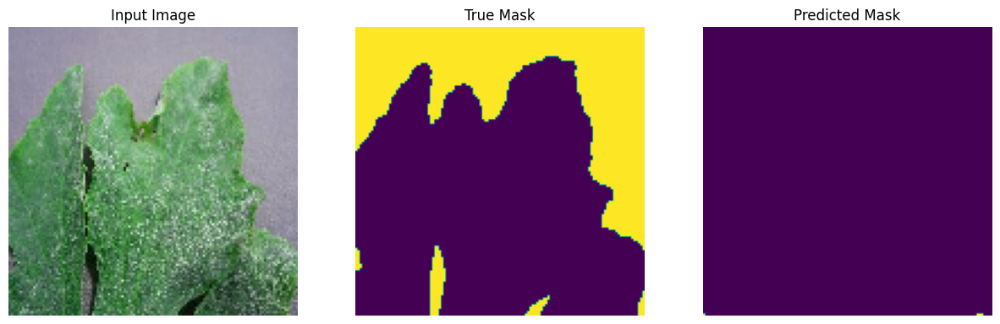

tf.Tensor(
[[[0.76279885 0.743074   0.7464902 ]
  [0.76645935 0.7467345  0.7501507 ]
  [0.76645935 0.7467345  0.7501507 ]
  ...
  [0.62370086 0.5938539  0.5925039 ]
  [0.60539854 0.57555157 0.5742016 ]
  [0.5980776  0.5682306  0.56688064]]

 [[0.76645935 0.7467345  0.7501507 ]
  [0.7554779  0.73575306 0.73916924]
  [0.75181746 0.73209256 0.7355087 ]
  ...
  [0.62370086 0.5938539  0.5925039 ]
  [0.64200324 0.6121563  0.6108063 ]
  [0.6127194  0.58287245 0.58152246]]

 [[0.76279885 0.743074   0.7464902 ]
  [0.75913835 0.7394135  0.74282974]
  [0.75913835 0.7394135  0.74282974]
  ...
  [0.6200404  0.5901935  0.58884346]
  [0.6163799  0.58653295 0.58518296]
  [0.64200324 0.6121563  0.6108063 ]]

 ...

 [[0.6708855  0.64000314 0.6643601 ]
  [0.674546   0.64366364 0.6680206 ]
  [0.674546   0.64366364 0.6680206 ]
  ...
  [0.5683923  0.53177387 0.5637858 ]
  [0.5757132  0.5390948  0.57110673]
  [0.55741084 0.5207924  0.55280435]]

 [[0.6855274  0.654645   0.679002  ]
  [0.6855274  0.654645   0

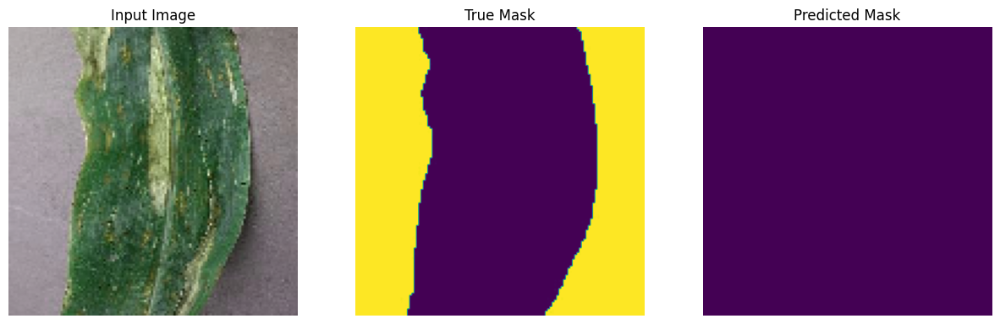

tf.Tensor(
[[[0.53561693 0.50998753 0.48598015]
  [0.5136856  0.48805612 0.46404883]
  [0.5246513  0.49902183 0.47501448]
  ...
  [0.5685139  0.54804367 0.50794286]
  [0.5612034  0.5407332  0.5006324 ]
  [0.55389297 0.53342277 0.49332199]]

 [[0.5575482  0.5319187  0.50791144]
  [0.5648587  0.5392293  0.5152219 ]
  [0.5283065  0.5026771  0.4786697 ]
  ...
  [0.55389297 0.53342277 0.49332199]
  [0.5758243  0.55535406 0.5152533 ]
  [0.57216907 0.5516988  0.5115981 ]]

 [[0.5246513  0.49902183 0.47501448]
  [0.5429274  0.5172979  0.49329057]
  [0.5283065  0.5026771  0.4786697 ]
  ...
  [0.5429274  0.5224571  0.4823563 ]
  [0.5685139  0.54804367 0.50794286]
  [0.5758243  0.55535406 0.5152533 ]]

 ...

 [[0.3455456  0.32822302 0.29178372]
  [0.3711321  0.35380954 0.31737024]
  [0.31630385 0.29898128 0.26254198]
  ...
  [0.32361424 0.29999638 0.2562341 ]
  [0.31630385 0.292686   0.24892367]
  [0.33092475 0.3073069  0.26354456]]

 [[0.36016646 0.3428439  0.3064046 ]
  [0.33823514 0.32091254 0

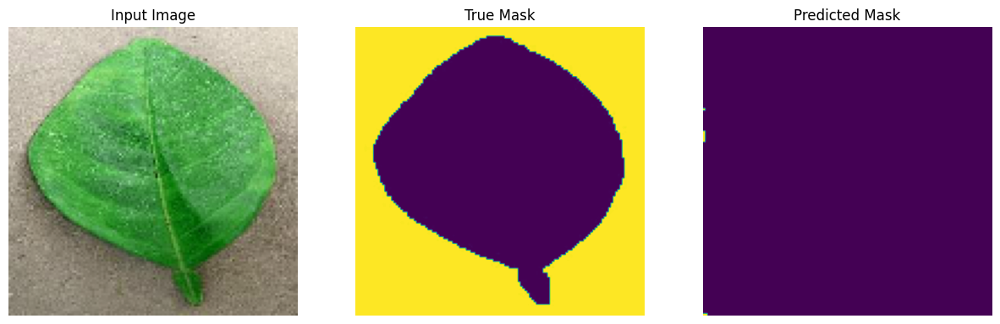

tf.Tensor(
[[[0.3599525  0.36567205 0.37767178]
  [0.37162223 0.37734178 0.3893415 ]
  [0.37940204 0.38512158 0.3971213 ]
  ...
  [0.41163826 0.41025174 0.42046076]
  [0.41941813 0.41803157 0.4282406 ]
  [0.41941813 0.41803157 0.4282406 ]]

 [[0.36773232 0.37345183 0.3854516 ]
  [0.36773232 0.37345183 0.3854516 ]
  [0.38718188 0.39290142 0.40490115]
  ...
  [0.42719796 0.42581138 0.43602043]
  [0.43108782 0.4297013  0.43991032]
  [0.40385854 0.40247193 0.41268098]]

 [[0.37940204 0.38512158 0.3971213 ]
  [0.37162223 0.37734178 0.3893415 ]
  [0.36773232 0.37345183 0.3854516 ]
  ...
  [0.41941813 0.41803157 0.4282406 ]
  [0.42719796 0.42581138 0.43602043]
  [0.43886763 0.4374811  0.44769013]]

 ...

 [[0.30373806 0.3092783  0.30019945]
  [0.28428847 0.28982878 0.2807499 ]
  [0.29595822 0.30149847 0.2924196 ]
  ...
  [0.39074457 0.39432567 0.38200396]
  [0.39074457 0.39432567 0.38200396]
  [0.3751849  0.37876603 0.3664443 ]]

 [[0.29595822 0.30149847 0.2924196 ]
  [0.28428847 0.28982878 0

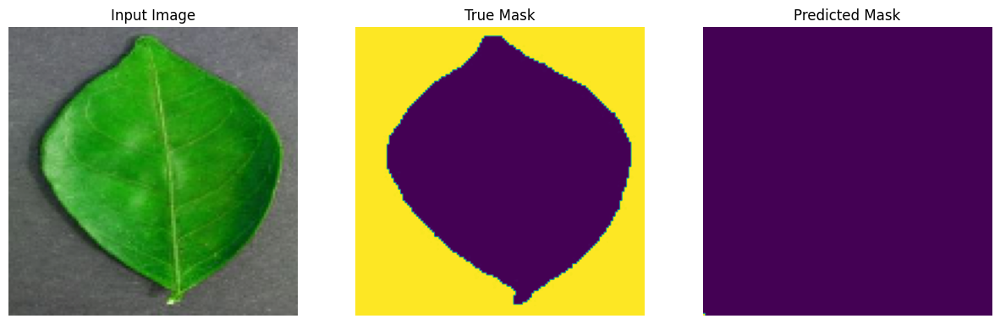

tf.Tensor(
[[[0.61484843 0.5738527  0.59780484]
  [0.6602518  0.619256   0.6432082 ]
  [0.6288187  0.587823   0.6117751 ]
  ...
  [0.62532616 0.5635018  0.5980239 ]
  [0.6078633  0.546039   0.58056104]
  [0.6288187  0.5669943  0.60151637]]

 [[0.6113559  0.5703601  0.5943123 ]
  [0.64278895 0.6017932  0.62574536]
  [0.6462815  0.60528576 0.6292379 ]
  ...
  [0.6358038  0.5739795  0.60850155]
  [0.6113559  0.5495315  0.58405364]
  [0.64278895 0.5809646  0.6154867 ]]

 [[0.61834097 0.57734525 0.6012974 ]
  [0.6602518  0.619256   0.6432082 ]
  [0.6497741  0.60877836 0.6327305 ]
  ...
  [0.6497741  0.58794975 0.6224718 ]
  [0.61484843 0.55302405 0.5875461 ]
  [0.64278895 0.5809646  0.6154867 ]]

 ...

 [[0.6358038  0.60175097 0.62680835]
  [0.61834097 0.5842881  0.6093455 ]
  [0.6392964  0.6052435  0.6303009 ]
  ...
  [0.61834097 0.5738739  0.6042162 ]
  [0.6392964  0.5948292  0.62517166]
  [0.62532616 0.58085895 0.6112014 ]]

 [[0.6497741  0.6157212  0.6407786 ]
  [0.61834097 0.5842881  0

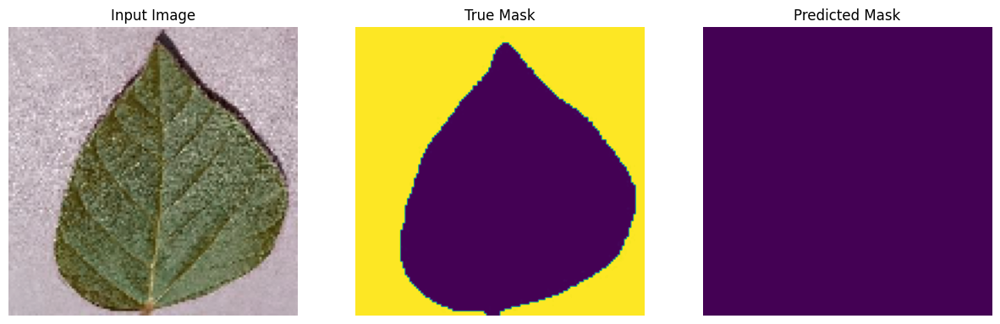

tf.Tensor(
[[[0.7541448  0.7126152  0.74688214]
  [0.8066028  0.7650732  0.7993401 ]
  [0.7728798  0.7313502  0.76561713]
  ...
  [0.6304939  0.58134425 0.612732  ]
  [0.63424087 0.58509123 0.616479  ]
  [0.6117589  0.56260926 0.593997  ]]

 [[0.7316628  0.6901332  0.72440016]
  [0.7916148  0.7500852  0.7843521 ]
  [0.7691328  0.7276032  0.76187015]
  ...
  [0.58178294 0.5326333  0.56402093]
  [0.6080119  0.55886227 0.59025   ]
  [0.491855   0.44270533 0.47409308]]

 [[0.79536176 0.75383216 0.7880991 ]
  [0.7878678  0.7463382  0.78060514]
  [0.7916148  0.7500852  0.7843521 ]
  ...
  [0.6080119  0.55886227 0.59025   ]
  [0.56304795 0.5138983  0.54528594]
  [0.5855299  0.5363803  0.5677679 ]]

 ...

 [[0.7364346  0.6974531  0.74950755]
  [0.6989646  0.65998316 0.71203756]
  [0.7139526  0.67497116 0.7270255 ]
  ...
  [0.6989646  0.65998316 0.71203756]
  [0.5715667  0.53258526 0.58463967]
  [0.63526565 0.5962842  0.6483386 ]]

 [[0.7027116  0.66373014 0.71578455]
  [0.65025365 0.61127216 0

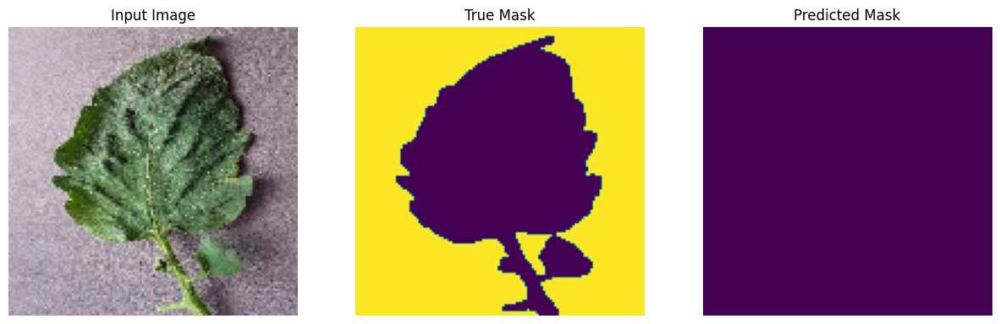

tf.Tensor(
[[[0.8945845  0.88522726 0.89938474]
  [0.9423395  0.93298227 0.9471397 ]
  [0.87229884 0.8629416  0.87709904]
  ...
  [0.73323584 0.7227985  0.7338341 ]
  [0.7173175  0.7068802  0.7179158 ]
  [0.6822971  0.6718599  0.6828954 ]]

 [[0.78315616 0.77379894 0.7879564 ]
  [0.85001314 0.840656   0.85481346]
  [0.8850335  0.8756763  0.88983375]
  ...
  [0.6695625  0.6591252  0.6701608 ]
  [0.73641944 0.72598225 0.73701775]
  [0.69503176 0.6845946  0.6956301 ]]

 [[0.8945845  0.88522726 0.89938474]
  [0.90413547 0.8947783  0.9089358 ]
  [0.87866616 0.86930895 0.8834664 ]
  ...
  [0.7268685  0.7164312  0.72746676]
  [0.73323584 0.7227985  0.7338341 ]
  [0.69503176 0.6845946  0.6956301 ]]

 ...

 [[0.7448904  0.7324113  0.74656874]
  [0.7448904  0.7324113  0.74656874]
  [0.77991074 0.7674316  0.7815891 ]
  ...
  [0.6112515  0.60491    0.6055541 ]
  [0.5857822  0.5794407  0.58008474]
  [0.6558229  0.64948136 0.6501254 ]]

 [[0.78627807 0.77379894 0.7879564 ]
  [0.7926454  0.7801663  0

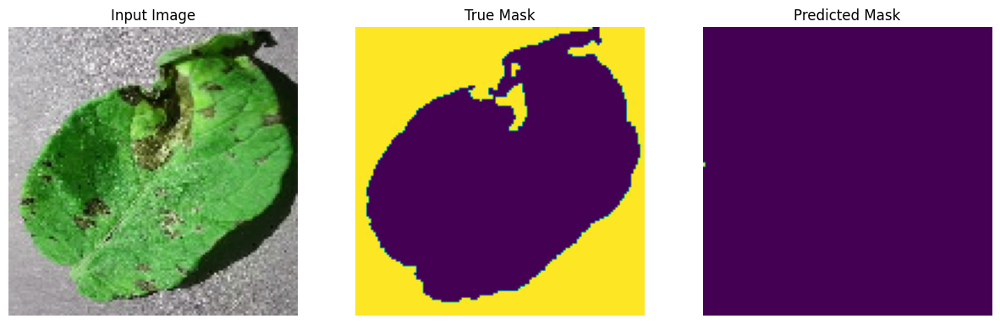

tf.Tensor(
[[[0.41737336 0.27345395 0.2891716 ]
  [0.4215773  0.27765796 0.2933756 ]
  [0.41737336 0.27345395 0.2891716 ]
  ...
  [0.51826876 0.4039646  0.40970054]
  [0.46782106 0.3535169  0.3592529 ]
  [0.5434926  0.4291885  0.43492442]]

 [[0.480433   0.33651364 0.35223135]
  [0.4215773  0.27765796 0.2933756 ]
  [0.37533355 0.23141418 0.24713182]
  ...
  [0.4972489  0.38294473 0.38868067]
  [0.5434926  0.4291885  0.43492442]
  [0.4972489  0.38294473 0.38868067]]

 [[0.4215773  0.27765796 0.2933756 ]
  [0.42578128 0.28186193 0.2975796 ]
  [0.47202504 0.3281057  0.3438234 ]
  ...
  [0.5981443  0.48384023 0.48957616]
  [0.50145286 0.3871487  0.39288464]
  [0.5813284  0.46702427 0.4727602 ]]

 ...

 [[0.37953752 0.26946414 0.28586194]
  [0.37533355 0.26526013 0.28165793]
  [0.39635342 0.28628004 0.30267784]
  ...
  [0.48884094 0.40415198 0.4210599 ]
  [0.5981443  0.5134554  0.5303633 ]
  [0.6107563  0.5260673  0.5429753 ]]

 [[0.33749777 0.22742435 0.24382216]
  [0.38794547 0.2778721  0

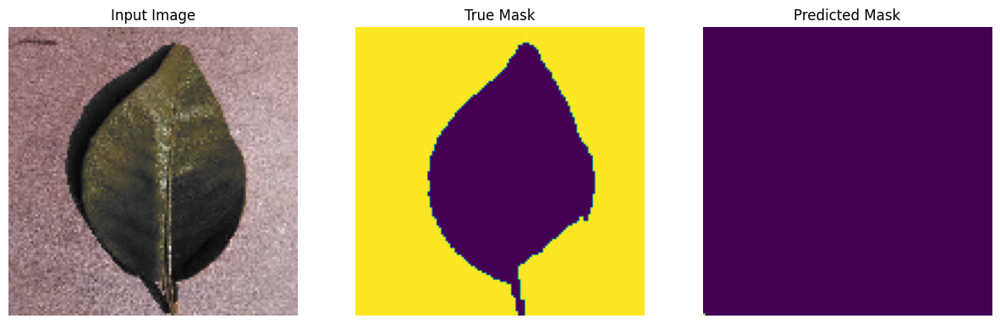

tf.Tensor(
[[[0.4486601  0.43135226 0.47660953]
  [0.4614913  0.44287798 0.48121053]
  [0.47301707 0.447479   0.4858116 ]
  ...
  [0.63852745 0.6462292  0.67018616]
  [0.6431285  0.6508302  0.67478716]
  [0.6431285  0.6508302  0.67478716]]

 [[0.4486601  0.43135226 0.47660953]
  [0.47074747 0.45790225 0.49994797]
  [0.43848616 0.4198728  0.4582054 ]
  ...
  [0.6431285  0.6508302  0.67478716]
  [0.6247244  0.6324261  0.65638304]
  [0.63852745 0.6462292  0.67018616]]

 [[0.43848616 0.4198728  0.4582054 ]
  [0.47069335 0.45208004 0.4904126 ]
  [0.4386005  0.43375838 0.47234178]
  ...
  [0.6201233  0.6278251  0.65178204]
  [0.6569316  0.66463333 0.6885903 ]
  [0.66153264 0.66923434 0.6931913 ]]

 ...

 [[0.19561845 0.16336077 0.08878367]
  [0.20942155 0.17716387 0.10258676]
  [0.12660298 0.09911314 0.02669284]
  ...
  [0.37078574 0.32899082 0.36519018]
  [0.4213971  0.3796022  0.41580155]
  [0.42599812 0.38420323 0.4204026 ]]

 [[0.19561845 0.16097686 0.08532134]
  [0.2600329  0.22777522 0

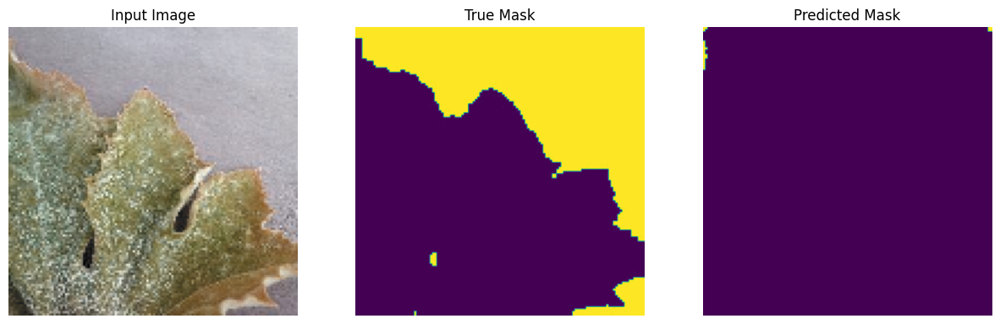

tf.Tensor(
[[[0.84104633 0.80586296 0.8164953 ]
  [0.82072794 0.7855446  0.7961769 ]
  [0.81734157 0.78215814 0.7927905 ]
  ...
  [0.7225224  0.67736065 0.6889405 ]
  [0.8241143  0.77895266 0.7905326 ]
  [0.8071823  0.76202065 0.7736005 ]]

 [[0.82072794 0.7855446  0.7961769 ]
  [0.8139551  0.77877176 0.7894041 ]
  [0.7970232  0.76183975 0.7724721 ]
  ...
  [0.79363674 0.7484751  0.760055  ]
  [0.77331835 0.7281567  0.7397366 ]
  [0.80040956 0.75524783 0.7668277 ]]

 [[0.79025036 0.75506693 0.76569927]
  [0.8071823  0.77199894 0.7826313 ]
  [0.7868639  0.75168055 0.7623129 ]
  ...
  [0.8715239  0.82636225 0.8379422 ]
  [0.8444327  0.79927105 0.810851  ]
  [0.76654553 0.72138387 0.7329638 ]]

 ...

 [[0.9223199  0.91818184 0.9221698 ]
  [0.9121607  0.9080227  0.9120106 ]
  [0.9561839  0.95204586 0.95603377]
  ...
  [0.6784992  0.6599463  0.666782  ]
  [0.79025036 0.77169746 0.77853316]
  [0.7225224  0.7039695  0.7108052 ]]

 [[0.9223199  0.91818184 0.9221698 ]
  [0.94602466 0.94188666 0

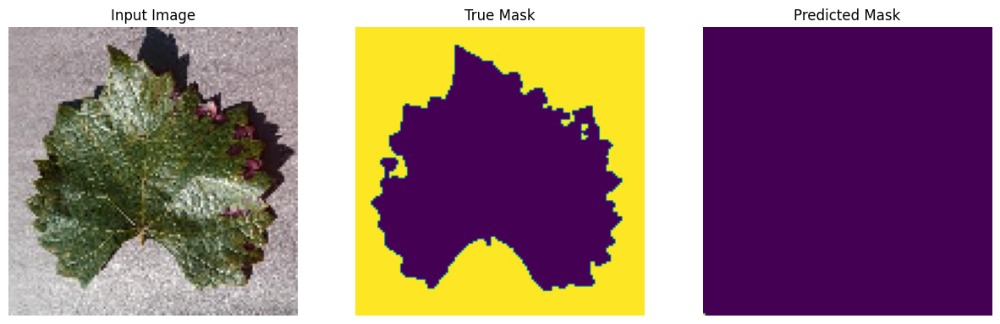

tf.Tensor(
[[[0.51401556 0.4845354  0.5334732 ]
  [0.5263588  0.49687862 0.5458164 ]
  [0.5263588  0.49687862 0.5458164 ]
  ...
  [0.6551323  0.6501031  0.7035054 ]
  [0.7168484  0.7118192  0.76522136]
  [0.6469034  0.6418743  0.6952766 ]]

 [[0.56338835 0.53390825 0.58284605]
  [0.5757316  0.5462514  0.5951893 ]
  [0.5222443  0.49276417 0.541702  ]
  ...
  [0.6469034  0.6418743  0.6952766 ]
  [0.71273386 0.7077048  0.7611071 ]
  [0.6469034  0.6418743  0.6952766 ]]

 [[0.5510444  0.5167029  0.56227404]
  [0.567502   0.5331605  0.57873166]
  [0.60041726 0.56607574 0.6116469 ]
  ...
  [0.59341633 0.58838713 0.6417893 ]
  [0.6551323  0.6501031  0.7035054 ]
  [0.6304458  0.6254167  0.678819  ]]

 ...

 [[0.6692486  0.6169441  0.65990096]
  [0.6733629  0.6210585  0.66401523]
  [0.6980493  0.6457449  0.6887016 ]
  ...
  [0.8543775  0.83650666 0.8585111 ]
  [0.84614867 0.8282779  0.8502823 ]
  [0.8338054  0.8159346  0.837939  ]]

 [[0.7186214  0.66631687 0.70927376]
  [0.7268502  0.6745457  0

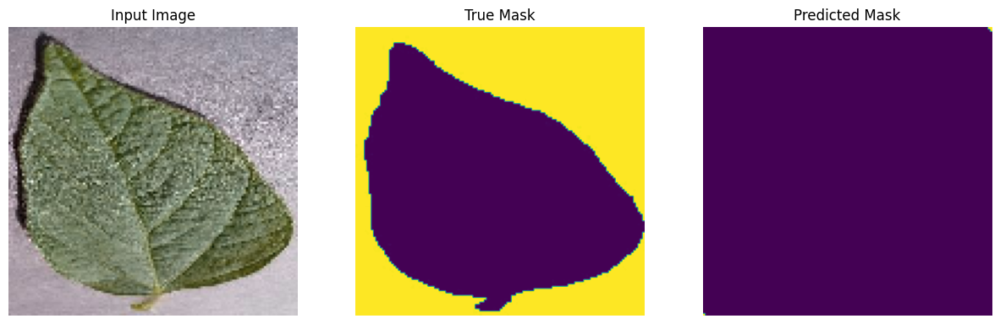

tf.Tensor(
[[[0.274468   0.2733976  0.2575716 ]
  [0.31205475 0.31098434 0.2951584 ]
  [0.28198534 0.28091493 0.26508898]
  ...
  [0.3784859  0.390987   0.3768078 ]
  [0.39727926 0.40978038 0.39560118]
  [0.38224456 0.3947457  0.38056648]]

 [[0.25567463 0.25460422 0.23877822]
  [0.30829608 0.30722567 0.29139972]
  [0.2594333  0.2583629  0.2425369 ]
  ...
  [0.3935206  0.4060217  0.3918425 ]
  [0.38600323 0.39850438 0.38432515]
  [0.3747272  0.38722834 0.3730491 ]]

 [[0.28198534 0.28091493 0.26508898]
  [0.31205475 0.31098434 0.2951584 ]
  [0.27822667 0.27715626 0.26133028]
  ...
  [0.4047966  0.41729775 0.40311852]
  [0.36345118 0.3759523  0.3617731 ]
  [0.39727926 0.40978038 0.39560118]]

 ...

 [[0.3091624  0.29139903 0.29767182]
  [0.2941277  0.2763643  0.2826371 ]
  [0.27157563 0.25381225 0.26008502]
  ...
  [0.3317145  0.32147422 0.3243068 ]
  [0.33923185 0.3289916  0.33182415]
  [0.34674922 0.33650893 0.3393415 ]]

 [[0.30164504 0.28388166 0.29015443]
  [0.3091624  0.29139903 0

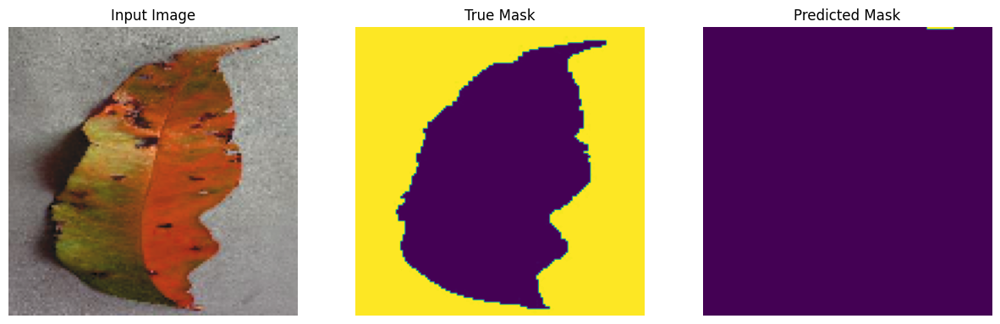

tf.Tensor(
[[[0.8094735  0.73092854 0.6671455 ]
  [0.7820285  0.7034835  0.6397005 ]
  [0.7511528  0.67260784 0.6088248 ]
  ...
  [0.84721047 0.77557635 0.725955  ]
  [0.8643636  0.7927295  0.74310815]
  [0.88151675 0.80988264 0.7602613 ]]

 [[0.73056906 0.65202403 0.588241  ]
  [0.7271384  0.6485934  0.5848104 ]
  [0.74429154 0.66574657 0.6019635 ]
  ...
  [0.93297625 0.86134213 0.8117208 ]
  [0.8129042  0.74127007 0.6916487 ]
  [0.85407174 0.7824376  0.7328163 ]]

 [[0.8300573  0.7515123  0.68772924]
  [0.7545835  0.67603844 0.6122554 ]
  [0.7614447  0.6828997  0.61911666]
  ...
  [0.8369186  0.7652845  0.71566314]
  [0.888378   0.81674397 0.76712257]
  [0.8334879  0.7618539  0.71223253]]

 ...

 [[0.8094735  0.71699333 0.64607286]
  [0.87808615 0.7856059  0.71468544]
  [0.76830596 0.6758257  0.60490525]
  ...
  [0.8163348  0.73780864 0.6704946 ]
  [0.86093295 0.78240687 0.71509284]
  [0.7854591  0.706933   0.639619  ]]

 [[0.84721047 0.7547302  0.68380976]
  [0.70655465 0.61407447 0

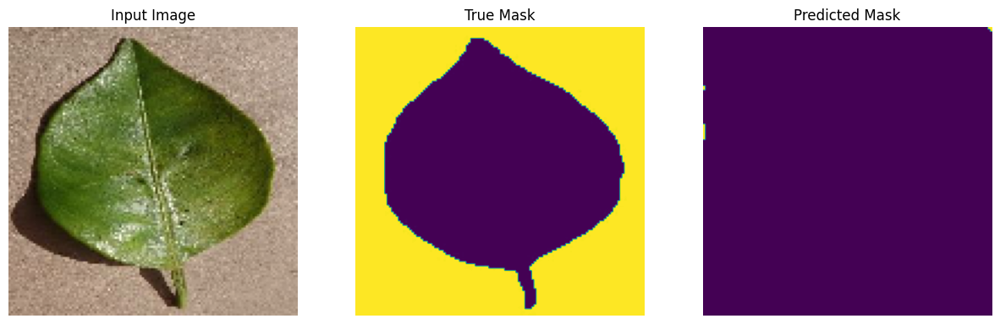

tf.Tensor(
[[[0.75160134 0.68448853 0.74141467]
  [0.7392713  0.67215836 0.7290846 ]
  [0.722831   0.6557182  0.71264434]
  ...
  [0.6899506  0.60351884 0.6719378 ]
  [0.6324099  0.54597807 0.6143971 ]
  [0.6488501  0.5624183  0.6308373 ]]

 [[0.75571144 0.6885986  0.74552476]
  [0.77626175 0.7091488  0.76607513]
  [0.7680416  0.7009288  0.75785494]
  ...
  [0.70228076 0.615849   0.684268  ]
  [0.5584289  0.47199708 0.54041606]
  [0.6940607  0.6076289  0.6760479 ]]

 [[0.75982153 0.6927086  0.74963486]
  [0.7351612  0.6680484  0.7249745 ]
  [0.75982153 0.6927086  0.74963486]
  ...
  [0.6077496  0.5213177  0.5897367 ]
  [0.62418973 0.53775793 0.60617685]
  [0.566649   0.48021722 0.5486362 ]]

 ...

 [[0.83380246 0.78594536 0.8185722 ]
  [0.85024273 0.80238557 0.8350125 ]
  [0.87901306 0.83115596 0.8637828 ]
  ...
  [0.52143836 0.41357625 0.48235428]
  [0.5748691  0.46700692 0.53578496]
  [0.55431885 0.4464567  0.5152347 ]]

 [[0.90778345 0.8599263  0.89255315]
  [0.8584628  0.8106057  0

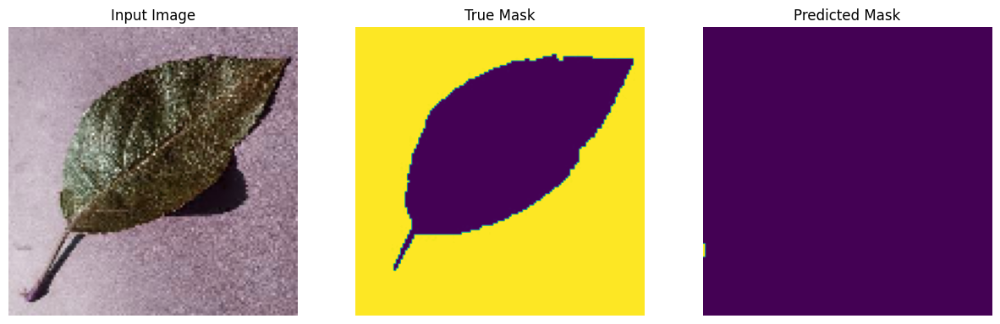

tf.Tensor(
[[[0.6939946  0.6574484  0.70089835]
  [0.7288303  0.6922841  0.73573405]
  [0.83333725 0.7967912  0.8402411 ]
  ...
  [0.8924947  0.84904474 0.89235485]
  [0.857659   0.81420904 0.85751915]
  [0.84895    0.80550015 0.8488102 ]]

 [[0.7854381  0.74889207 0.79234195]
  [0.811565   0.7750189  0.8184688 ]
  [0.802856   0.76631    0.80975986]
  ...
  [0.857659   0.81420904 0.85751915]
  [0.89684904 0.85339916 0.89670926]
  [0.91426694 0.87081707 0.9141271 ]]

 [[0.8507552  0.81420904 0.857659  ]
  [0.8159195  0.77937335 0.8228233 ]
  [0.763666   0.7271198  0.77056974]
  ...
  [0.86201334 0.81856346 0.86187357]
  [0.87072235 0.8272724  0.8705825 ]
  [0.8402411  0.7967912  0.8401013 ]]

 ...

 [[0.8533045  0.7992891  0.8304474 ]
  [0.6007457  0.5432084  0.5855773 ]
  [0.80540544 0.7478682  0.790237  ]
  ...
  [0.74008846 0.6895949  0.72715163]
  [0.9970017  0.94650817 0.9840648 ]
  [0.8228233  0.7723297  0.80988646]]

 [[0.7966965  0.7391593  0.7815282 ]
  [0.70525277 0.6477155  0

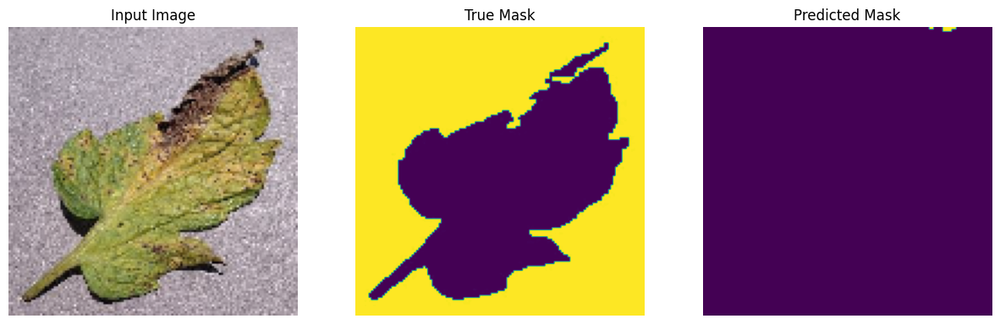

tf.Tensor(
[[[0.47564745 0.40864974 0.47048935]
  [0.48450205 0.41750437 0.47934398]
  [0.45351088 0.3865132  0.44835278]
  ...
  [0.6128941  0.5458964  0.60378194]
  [0.6925857  0.62558806 0.6834736 ]
  [0.6571672  0.59016955 0.6480551 ]]

 [[0.78998655 0.7229889  0.7848285 ]
  [0.64388525 0.5768876  0.63872725]
  [0.5509117  0.48391405 0.54575366]
  ...
  [0.57304823 0.5060506  0.56393605]
  [0.6881584  0.62116075 0.6790463 ]
  [0.6615945  0.59459686 0.6524824 ]]

 [[0.7235769  0.65657926 0.71841884]
  [0.6837311  0.61673343 0.6785731 ]
  [0.67487645 0.6078788  0.66971844]
  ...
  [0.5774756  0.51047796 0.5683634 ]
  [0.5464844  0.47948673 0.53737223]
  [0.6128941  0.5458964  0.60378194]]

 ...

 [[0.7280042  0.65309834 0.7083725 ]
  [0.6173214  0.5424155  0.5976897 ]
  [0.71029496 0.6353891  0.6906633 ]
  ...
  [0.7235769  0.64867103 0.7118533 ]
  [0.6660218  0.59111595 0.6542983 ]
  [0.7280042  0.65309834 0.71628064]]

 [[0.6173214  0.5424155  0.5976897 ]
  [0.6925857  0.61767983 0

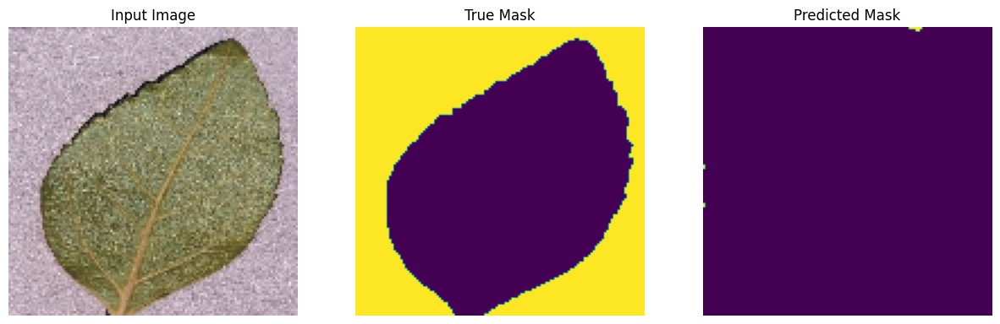

tf.Tensor(
[[[0.49359393 0.48621258 0.48425296]
  [0.49719214 0.48981082 0.48785117]
  [0.47920117 0.47181985 0.4698602 ]
  ...
  [0.5619596  0.5496242  0.5558793 ]
  [0.56555784 0.5532224  0.5594775 ]
  [0.5619596  0.5496242  0.5558793 ]]

 [[0.48639756 0.4790162  0.47705656]
  [0.5223795  0.5149982  0.5130385 ]
  [0.5151831  0.5078018  0.50584215]
  ...
  [0.5619596  0.5496242  0.5558793 ]
  [0.56915605 0.55682063 0.5630757 ]
  [0.56555784 0.5532224  0.5594775 ]]

 [[0.51158494 0.5042036  0.50224394]
  [0.48999575 0.48261443 0.48065478]
  [0.50079036 0.493409   0.49144936]
  ...
  [0.57275426 0.5604188  0.56667393]
  [0.56915605 0.55682063 0.5630757 ]
  [0.5583615  0.546026   0.5522811 ]]

 ...

 [[0.4540138  0.43327755 0.4267061 ]
  [0.4432192  0.42248297 0.41591153]
  [0.48639756 0.46566132 0.45908988]
  ...
  [0.5619596  0.54122347 0.534652  ]
  [0.56555784 0.5448217  0.5382502 ]
  [0.56555784 0.5448217  0.5382502 ]]

 [[0.4432192  0.42248297 0.41591153]
  [0.46480837 0.44407213 0

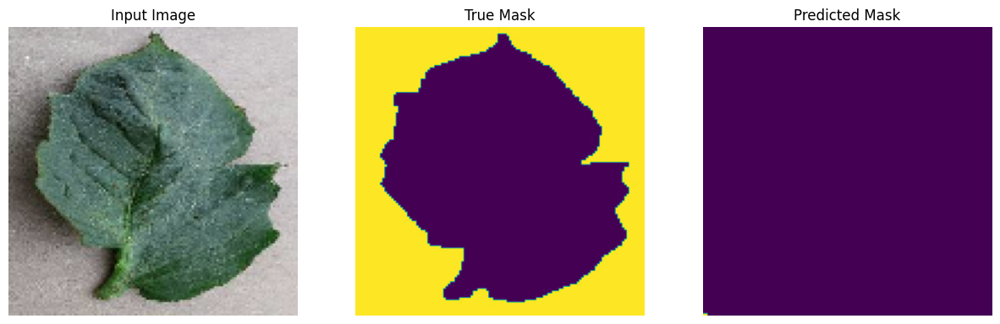

tf.Tensor(
[[[0.7509583  0.82528716 0.7367554 ]
  [0.77887416 0.8535449  0.75068355]
  [0.76387554 0.8464805  0.7113776 ]
  ...
  [0.7019078  0.69357735 0.766253  ]
  [0.68071455 0.6723841  0.7450597 ]
  [0.6842468  0.6759163  0.74859196]]

 [[0.74395895 0.8076261  0.71551186]
  [0.82480776 0.89239925 0.7859555 ]
  [0.76394063 0.83588386 0.69719857]
  ...
  [0.6983756  0.6900452  0.7627208 ]
  [0.67365015 0.6653197  0.7379953 ]
  [0.6701179  0.66178745 0.7344631 ]]

 [[0.9206347  0.9736402  0.8779436 ]
  [0.874138   0.938318   0.8247095 ]
  [0.8982149  0.9665758  0.8278905 ]
  ...
  [0.67365015 0.6653197  0.7379953 ]
  [0.6701179  0.66178745 0.7344631 ]
  [0.68777895 0.67944854 0.7521242 ]]

 ...

 [[0.3591306  0.3373254  0.3741772 ]
  [0.33793727 0.31613213 0.3529839 ]
  [0.45450038 0.43269524 0.469547  ]
  ...
  [0.51121837 0.49930555 0.5719812 ]
  [0.47942844 0.46751562 0.5401913 ]
  [0.5076862  0.49577338 0.568449  ]]

 [[0.33793727 0.31613213 0.3529839 ]
  [0.38738835 0.36558312 0

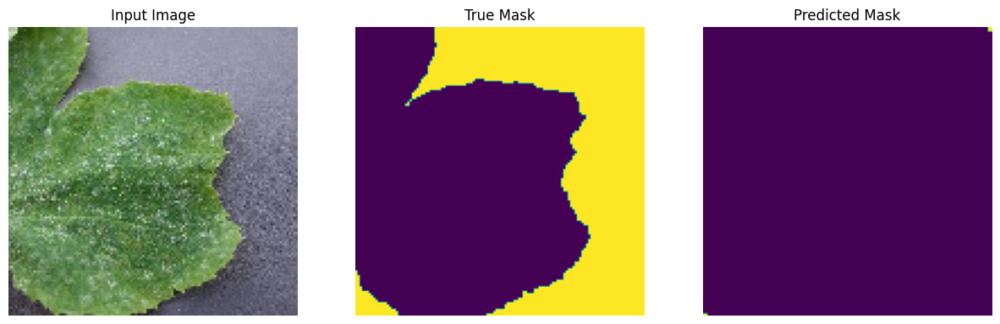

tf.Tensor(
[[[0.3167924  0.3216838  0.30833453]
  [0.29444674 0.29933813 0.2859889 ]
  [0.3279652  0.3328566  0.31950733]
  ...
  [0.43077806 0.4408604  0.4315643 ]
  [0.4382266  0.44830894 0.43901286]
  [0.4382266  0.44830894 0.43901286]]

 [[0.30561954 0.31051093 0.2971617 ]
  [0.28327394 0.28816533 0.27481607]
  [0.32424092 0.32913232 0.31578305]
  ...
  [0.4233295  0.43341184 0.42411572]
  [0.4233295  0.43341184 0.42411572]
  [0.43077806 0.4408604  0.4315643 ]]

 [[0.30561954 0.31051093 0.2971617 ]
  [0.26465258 0.26954398 0.25619474]
  [0.30934384 0.31423524 0.30088595]
  ...
  [0.42705378 0.4371361  0.42784   ]
  [0.43077806 0.4408604  0.4315643 ]
  [0.43077806 0.4408604  0.4315643 ]]

 ...

 [[0.27245915 0.28444105 0.2678249 ]
  [0.2910805  0.3030624  0.28644624]
  [0.27618343 0.28816533 0.27154917]
  ...
  [0.36184165 0.37382355 0.3572074 ]
  [0.36929017 0.38127208 0.3646559 ]
  [0.37301445 0.38499635 0.36838016]]

 [[0.242665   0.2546469  0.23803073]
  [0.26128635 0.27326825 0

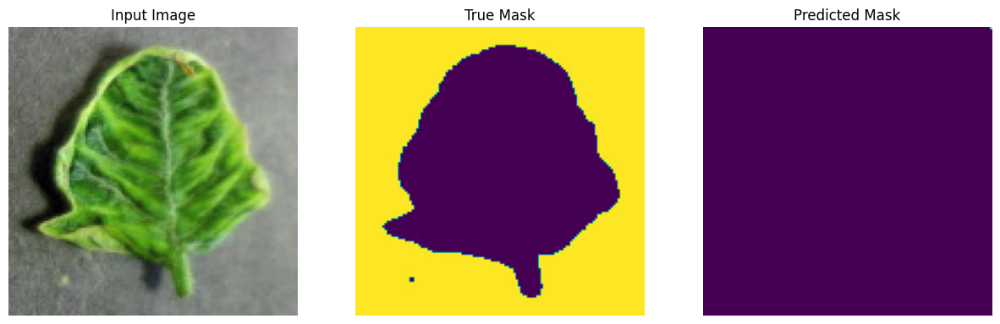

tf.Tensor(
[[[0.71363795 0.6983755  0.7068502 ]
  [0.5123979  0.49713537 0.50561005]
  [0.67812496 0.66286254 0.67133725]
  ...
  [0.5123979  0.47096813 0.479141  ]
  [0.5163438  0.47491398 0.48308682]
  [0.45320964 0.41177982 0.41995266]]

 [[0.6465579  0.63129544 0.63977015]
  [0.7294215  0.7141591  0.7226337 ]
  [0.8320145  0.8167521  0.82522666]
  ...
  [0.5400191  0.4985893  0.50676215]
  [0.5045061  0.46307635 0.47124922]
  [0.5400191  0.4985893  0.50676215]]

 [[0.6939085  0.678646   0.6871208 ]
  [0.6189368  0.6036743  0.61214894]
  [0.5597485  0.544486   0.55296075]
  ...
  [0.50845206 0.46702224 0.4751951 ]
  [0.46110138 0.4196716  0.42784443]
  [0.50845206 0.46702224 0.4751951 ]]

 ...

 [[0.6426121  0.6273496  0.6358242 ]
  [0.66628736 0.65102494 0.6594995 ]
  [0.6702332  0.65497077 0.6634455 ]
  ...
  [0.49266845 0.4698092  0.4842001 ]
  [0.5163438  0.49348453 0.5078754 ]
  [0.4847767  0.46191746 0.47630835]]

 [[0.6307744  0.6155119  0.62398666]
  [0.6702332  0.65497077 0

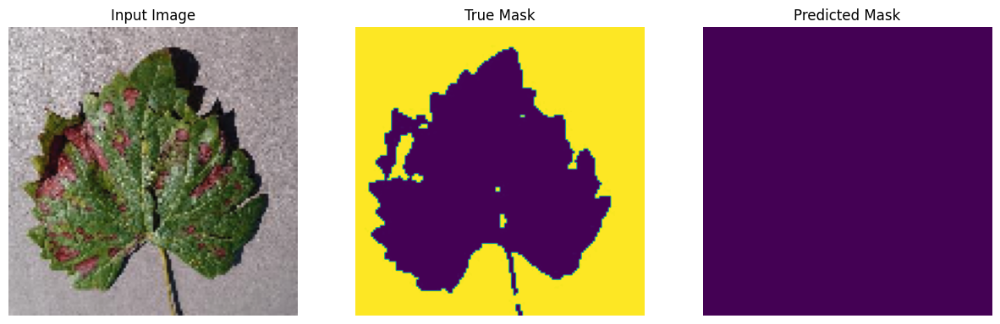

tf.Tensor(
[[[0.47326964 0.3935407  0.4464534 ]
  [0.45716548 0.37743658 0.4303493 ]
  [0.43300927 0.3532803  0.40619302]
  ...
  [0.618207   0.54532856 0.6100765 ]
  [0.6584674  0.58558893 0.65033686]
  [0.56184244 0.48896402 0.55371195]]

 [[0.49742585 0.41769692 0.47060964]
  [0.36054057 0.28081164 0.33372435]
  [0.30820206 0.22847313 0.2813858 ]
  ...
  [0.63431114 0.5614327  0.62618065]
  [0.65444136 0.5815629  0.6463108 ]
  [0.618207   0.54532856 0.6100765 ]]

 [[0.41287908 0.33315012 0.38606286]
  [0.32833225 0.24860331 0.30151603]
  [0.36456662 0.28483766 0.3377504 ]
  ...
  [0.58197266 0.50909424 0.57384217]
  [0.5900247  0.5171463  0.5818942 ]
  [0.60612893 0.53325045 0.59799844]]

 ...

 [[0.3323583  0.28345665 0.30399635]
  [0.2800198  0.22084239 0.2476061 ]
  [0.28404582 0.22144318 0.24228925]
  ...
  [0.44106132 0.3681829  0.40895405]
  [0.44106132 0.3681829  0.40895405]
  [0.37664473 0.30376628 0.34453738]]

 [[0.18742093 0.12824354 0.1721335 ]
  [0.3846968  0.32894462 0

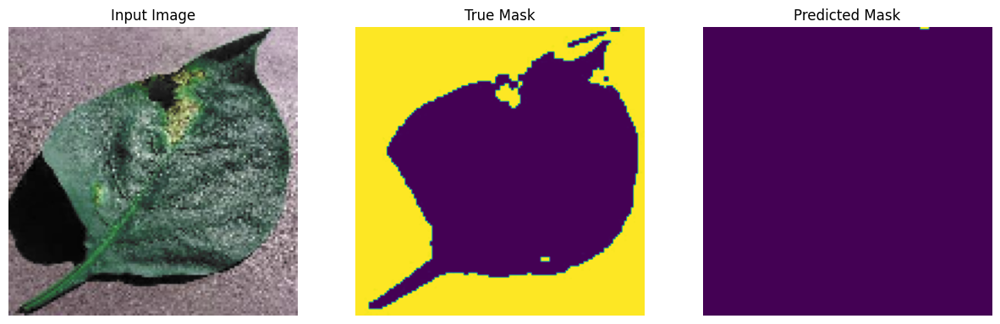

tf.Tensor(
[[[0.5976537  0.62756276 0.6613101 ]
  [0.5795629  0.6094721  0.64321935]
  [0.5831811  0.6130902  0.6468375 ]
  ...
  [0.65039396 0.6670993  0.6938735 ]
  [0.64677584 0.6634811  0.6902554 ]
  [0.67933923 0.69604445 0.72281873]]

 [[0.52529055 0.5551996  0.58894694]
  [0.5433814  0.5732905  0.6070378 ]
  [0.5650903  0.59499943 0.6287467 ]
  ...
  [0.6431576  0.6598629  0.68663716]
  [0.6250669  0.6417722  0.66854644]
  [0.6395395  0.6562448  0.68301904]]

 [[0.5433814  0.5732905  0.6070378 ]
  [0.5614721  0.59138125 0.6251285 ]
  [0.5542358  0.584145   0.61789227]
  ...
  [0.6250669  0.6417722  0.66854644]
  [0.65401214 0.6707174  0.69749165]
  [0.65401214 0.6707174  0.69749165]]

 ...

 [[0.35738385 0.37981454 0.41527545]
  [0.31396595 0.3363966  0.37185752]
  [0.3935654  0.41599607 0.45145702]
  ...
  [0.3623571  0.3565875  0.3971846 ]
  [0.41301134 0.4072417  0.44783887]
  [0.3840661  0.37829646 0.41889364]]

 [[0.35738385 0.37981454 0.41527545]
  [0.3175841  0.34001473 0

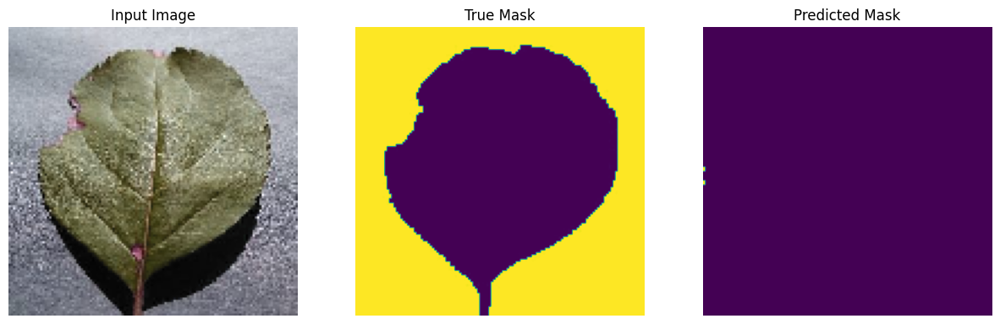

tf.Tensor(
[[[0.64079344 0.6371373  0.66333187]
  [0.6361942  0.63253796 0.6587324 ]
  [0.62239593 0.6187397  0.64493436]
  ...
  [0.31996825 0.2634132  0.30171242]
  [0.36136267 0.30480763 0.34310687]
  [0.329167   0.27261198 0.3109112 ]]

 [[0.63159466 0.6279385  0.6541331 ]
  [0.63159466 0.6279385  0.6541331 ]
  [0.62239593 0.6187397  0.64493436]
  ...
  [0.3797602  0.32320514 0.36150438]
  [0.37056145 0.3140064  0.35230562]
  [0.36136267 0.30480763 0.34310687]]

 [[0.63159466 0.6279385  0.6541331 ]
  [0.64999217 0.646336   0.67253065]
  [0.659191   0.6555348  0.68172944]
  ...
  [0.4027571  0.34620205 0.38450128]
  [0.38895896 0.3324039  0.37070313]
  [0.42115462 0.36459956 0.4028988 ]]

 ...

 [[0.67795426 0.67585534 0.7093257 ]
  [0.65955675 0.65745777 0.69092816]
  [0.67795426 0.67585534 0.7093257 ]
  ...
  [0.31536886 0.25881383 0.29711306]
  [0.31536886 0.25881383 0.29711306]
  [0.3061701  0.24961506 0.28791428]]

 [[0.65955675 0.65745777 0.69092816]
  [0.7009512  0.6988523  0

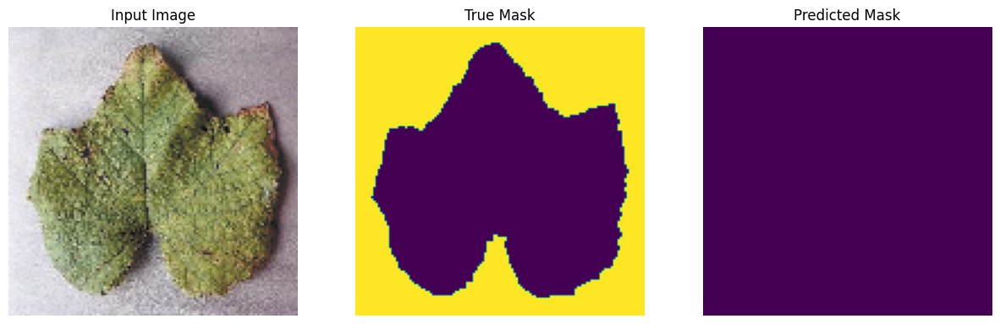

tf.Tensor(
[[[0.5491275  0.5088252  0.5621051 ]
  [0.34596765 0.30566522 0.3589452 ]
  [0.35666028 0.31635785 0.36963785]
  ...
  [0.43054256 0.40215275 0.45874304]
  [0.44123524 0.41284537 0.46943572]
  [0.44836363 0.4199738  0.47656414]]

 [[0.43507284 0.39477044 0.4480504 ]
  [0.50992125 0.4696188  0.52289885]
  [0.42438024 0.38407782 0.43735778]
  ...
  [0.53746885 0.50907904 0.56566936]
  [0.49826252 0.46987268 0.52646303]
  [0.44479942 0.41640958 0.47299993]]

 [[0.4992286  0.45892617 0.5122062 ]
  [0.55269176 0.51238936 0.56566936]
  [0.43150866 0.39120623 0.4444862 ]
  ...
  [0.523212   0.4948222  0.5514125 ]
  [0.5339047  0.50551486 0.5621051 ]
  [0.46262047 0.43423063 0.49082097]]

 ...

 [[0.33145693 0.2878442  0.34112418]
  [0.47758952 0.43397677 0.48725677]
  [0.39917684 0.35556415 0.4088441 ]
  ...
  [0.56601894 0.5330129  0.57636195]
  [0.633739   0.6007329  0.64408195]
  [0.7228441  0.6898381  0.7331871 ]]

 [[0.47402534 0.43041253 0.48369253]
  [0.45976853 0.4161557  0

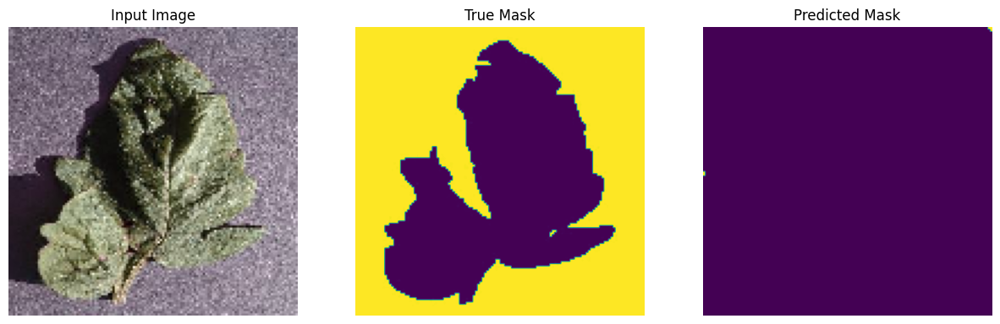

tf.Tensor(
[[[0.22381952 0.26146957 0.28203478]
  [0.23876773 0.2764178  0.29698297]
  [0.26492706 0.30257714 0.32314235]
  ...
  [0.2803844  0.33799505 0.36051285]
  [0.27664736 0.33425805 0.3567758 ]
  [0.2729103  0.330521   0.35303873]]

 [[0.21634543 0.25399548 0.2745607 ]
  [0.23129362 0.26894367 0.28950888]
  [0.27613822 0.3137883  0.3343535 ]
  ...
  [0.28785852 0.3454692  0.36798695]
  [0.28785852 0.3454692  0.36798695]
  [0.29159558 0.34920627 0.371724  ]]

 [[0.21634543 0.25399548 0.2745607 ]
  [0.17150083 0.20915088 0.22971609]
  [0.24624182 0.2838919  0.30445707]
  ...
  [0.2803844  0.33799505 0.36051285]
  [0.2803844  0.33799505 0.36051285]
  [0.27664736 0.33425805 0.3567758 ]]

 ...

 [[0.24624182 0.2838919  0.30445707]
  [0.25745296 0.29510304 0.31566826]
  [0.35461625 0.3922663  0.41283152]
  ...
  [0.31587136 0.3701924  0.3866722 ]
  [0.3121343  0.36645535 0.38293514]
  [0.30839726 0.36271822 0.37919807]]

 [[0.24250478 0.28015482 0.30072004]
  [0.3060346  0.34368467 0

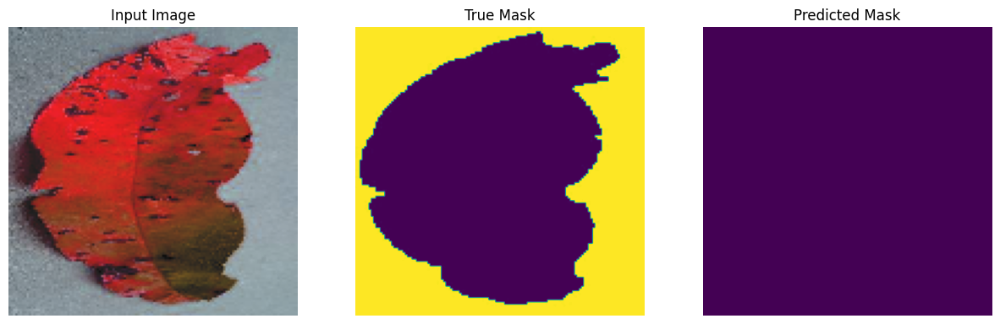

tf.Tensor(
[[[0.24534187 0.22238682 0.21952993]
  [0.23490778 0.21195273 0.20909584]
  [0.25229794 0.22934288 0.226486  ]
  ...
  [0.40185323 0.3845433  0.37279427]
  [0.38794112 0.37063116 0.35888213]
  [0.4088093  0.39149934 0.3797503 ]]

 [[0.2140396  0.19108455 0.18822765]
  [0.22447369 0.20151864 0.19866174]
  [0.26273203 0.23977697 0.23692009]
  ...
  [0.3983752  0.38106525 0.36931622]
  [0.40533125 0.38802135 0.3762723 ]
  [0.4401116  0.42280167 0.4110526 ]]

 [[0.2140396  0.19108455 0.18822765]
  [0.20012748 0.17717242 0.17431554]
  [0.2140396  0.19108455 0.18822765]
  ...
  [0.5027161  0.48540622 0.47365716]
  [0.4644578  0.44714788 0.43539885]
  [0.43315554 0.41584557 0.40409654]]

 ...

 [[0.23838581 0.22107588 0.20932683]
  [0.23838581 0.22107588 0.20932683]
  [0.22447369 0.20716375 0.19541472]
  ...
  [0.6279252  0.60891736 0.5923722 ]
  [0.65227145 0.6332635  0.61671835]
  [0.6383593  0.61935145 0.60280627]]

 [[0.2488199  0.23150997 0.21976092]
  [0.21751763 0.2002077  0

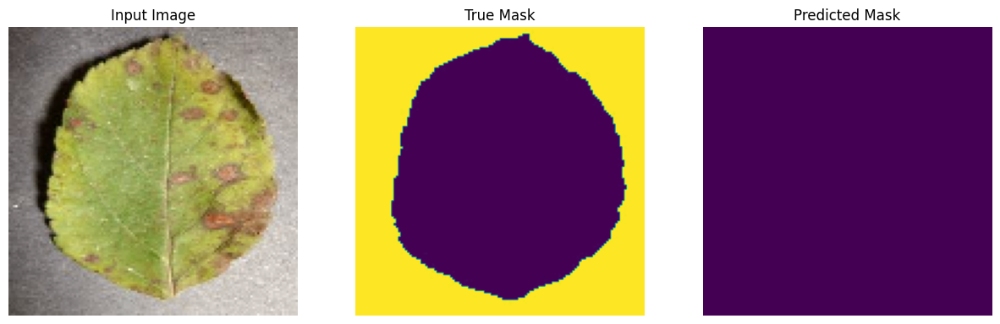

tf.Tensor(
[[[0.6677271  0.8186219  0.84773695]
  [0.6709362  0.821831   0.85094607]
  [0.66130877 0.8122035  0.8413186 ]
  ...
  [0.49402797 0.6175992  0.65518636]
  [0.5357473  0.65931845 0.6969057 ]
  [0.61918586 0.7427571  0.78034425]]

 [[0.683773   0.8346678  0.8637829 ]
  [0.6901913  0.84108615 0.87020123]
  [0.6805638  0.83145857 0.86057365]
  ...
  [0.54216564 0.6657368  0.703324  ]
  [0.54216564 0.6657368  0.703324  ]
  [0.5004463  0.62401754 0.6616047 ]]

 [[0.6805638  0.83145857 0.86057365]
  [0.6901913  0.84108615 0.87020123]
  [0.6805638  0.83145857 0.86057365]
  ...
  [0.62239504 0.74596626 0.7835534 ]
  [0.51007384 0.63364506 0.6712323 ]
  [0.513283   0.63685423 0.67444146]]

 ...

 [[0.60675275 0.7576475  0.7867626 ]
  [0.6035435  0.7544383  0.78355336]
  [0.6163802  0.767275   0.7963901 ]
  ...
  [0.529845   0.6603973  0.6936965 ]
  [0.51058996 0.64114225 0.67444146]
  [0.5170083  0.6475606  0.6808598 ]]

 [[0.6131711  0.76406586 0.79318094]
  [0.60996187 0.7608566  0

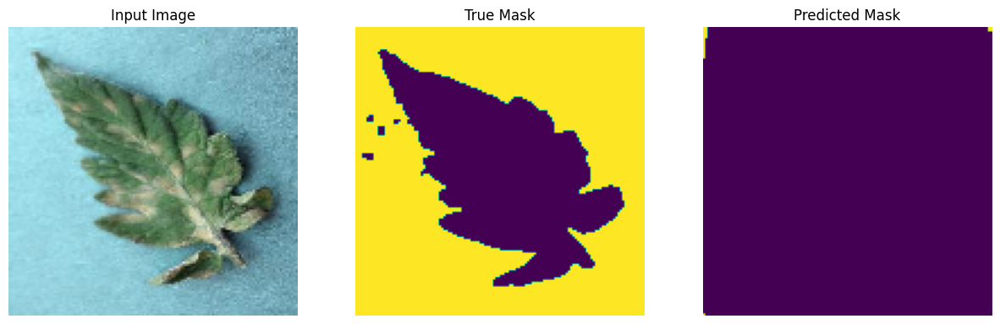

tf.Tensor(
[[[0.5363144  0.52411085 0.48362043]
  [0.6631312  0.6509276  0.6104372 ]
  [0.6540728  0.6418693  0.60137886]
  ...
  [0.68124783 0.66723835 0.6363568 ]
  [0.6087811  0.5947716  0.56389004]
  [0.6268978  0.61288834 0.58200675]]

 [[0.69483536 0.68263185 0.6421414 ]
  [0.6767187  0.6645152  0.6240247 ]
  [0.59066445 0.57846093 0.5379705 ]
  ...
  [0.6948354  0.6808258  0.6499443 ]
  [0.68577707 0.6717675  0.64088595]
  [0.6631312  0.64912164 0.6182401 ]]

 [[0.45931852 0.44711494 0.40662456]
  [0.5544311  0.5422275  0.5017371 ]
  [0.604252   0.59204847 0.55155796]
  ...
  [0.6223687  0.6083591  0.5774776 ]
  [0.68577707 0.6717675  0.64088595]
  [0.63595617 0.6219467  0.5910651 ]]

 ...

 [[0.5725478  0.5603443  0.5198538 ]
  [0.70389366 0.6916901  0.65119976]
  [0.6404853  0.6282817  0.5877914 ]
  ...
  [0.7401271  0.7178107  0.695236  ]
  [0.6404853  0.61816883 0.5955942 ]
  [0.6404853  0.61816883 0.5955942 ]]

 [[0.6631312  0.6509276  0.6104372 ]
  [0.58613527 0.57393175 0

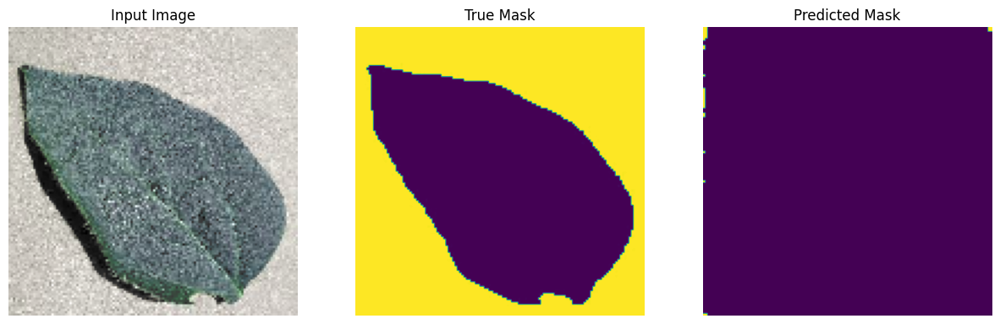

tf.Tensor(
[[[0.56863    0.547401   0.5898785 ]
  [0.5516117  0.5303827  0.5728602 ]
  [0.5822446  0.5610156  0.6034931 ]
  ...
  [0.5817943  0.5541323  0.59328216]
  [0.5681797  0.5405176  0.5796675 ]
  [0.57498705 0.54732496 0.58647484]]

 [[0.54820806 0.526979   0.5694566 ]
  [0.57203364 0.5508047  0.59328216]
  [0.5550153  0.53378636 0.57626384]
  ...
  [0.51712483 0.48946276 0.5286126 ]
  [0.57498705 0.54732496 0.58647484]
  [0.55116147 0.52349937 0.56264925]]

 [[0.6162812  0.59505224 0.63752973]
  [0.558419   0.53719    0.5796675 ]
  [0.5754373  0.55420834 0.5966858 ]
  ...
  [0.53414315 0.50648105 0.54563093]
  [0.57498705 0.54732496 0.58647484]
  [0.5613724  0.5337103  0.5728602 ]]

 ...

 [[0.3605506  0.31935585 0.36183336]
  [0.38097256 0.3397778  0.38225532]
  [0.4592567  0.41806194 0.46053946]
  ...
  [0.5652434  0.4969363  0.51155955]
  [0.6809678  0.5993502  0.5997741 ]
  [0.57205075 0.48706302 0.47301337]]

 [[0.46606404 0.42486924 0.4673468 ]
  [0.346936   0.30574122 0

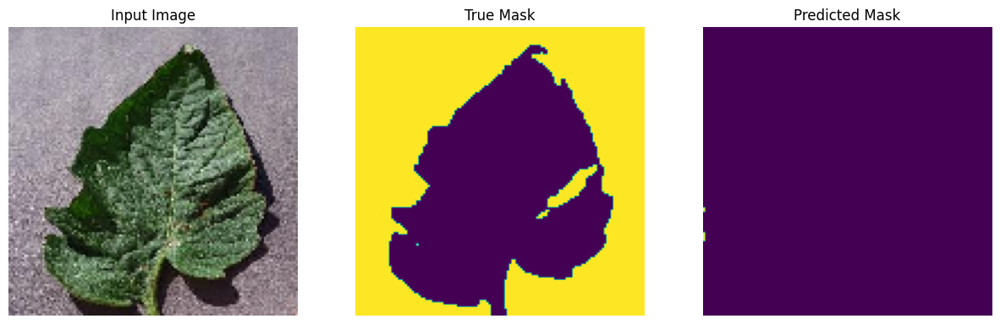

tf.Tensor(
[[[0.21895859 0.21108648 0.31736645]
  [0.19644074 0.18856864 0.29484862]
  [0.21145263 0.20358053 0.3098605 ]
  ...
  [0.19977878 0.19509885 0.2835897 ]
  [0.1810139  0.17633396 0.2648248 ]
  [0.16600199 0.16132206 0.2498129 ]]

 [[0.26399428 0.25612217 0.36240214]
  [0.23021752 0.22234541 0.32862538]
  [0.25648832 0.24861622 0.3548962 ]
  ...
  [0.1810139  0.17633396 0.2648248 ]
  [0.18476687 0.18008694 0.26857778]
  [0.21103771 0.20635778 0.29484862]]

 [[0.23772344 0.22985134 0.33613133]
  [0.16266397 0.15479186 0.26107183]
  [0.21145263 0.20358053 0.3098605 ]
  ...
  [0.17350793 0.168828   0.25731885]
  [0.13597818 0.13129824 0.21978912]
  [0.21854363 0.2138637  0.30235454]]

 ...

 [[0.4103531  0.4135328  0.535039  ]
  [0.42161202 0.42479175 0.5462979 ]
  [0.42911795 0.43229765 0.55380386]
  ...
  [0.3949509  0.4015422  0.51252115]
  [0.40245685 0.40904814 0.5200271 ]
  [0.4062098  0.4128011  0.52378005]]

 [[0.43287092 0.43605065 0.55755687]
  [0.43287092 0.43605065 0

2024-08-14 09:38:45.626992: W tensorflow/core/kernels/data/cache_dataset_ops.cc:854] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


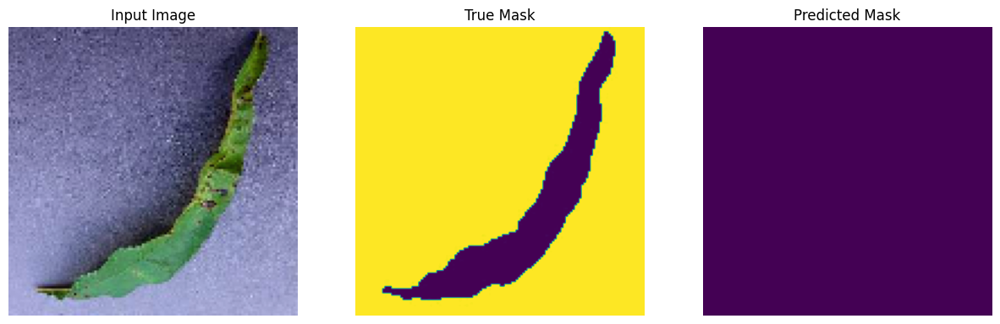

In [62]:
# show_predictions(aug_train_batches, 30)
# show_predictions(test_batches, 30)
show_predictions(train_batches, 30)
# show_predictions(tomato_background_batches, 30)

In [63]:
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    clear_output(wait=True)
    show_predictions()
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

In [64]:
! pip list | grep tensorflow

tensorflow                    2.14.1
tensorflow-addons             0.23.0
tensorflow-datasets           4.9.6
tensorflow-estimator          2.14.0
tensorflow-examples           0.1703207612.1461250479831370929614362828255168868146460245314
tensorflow-hub                0.16.1
tensorflow-io-gcs-filesystem  0.34.0
tensorflow-metadata           1.15.0
tensorflow-model-optimization 0.8.0
tensorflow-probability        0.24.0
tensorflow-text               2.14.0


In [65]:
#code to fit the model 

TRAIN_LENGTH = train_size
BATCH_SIZE = 32
BUFFER_SIZE = 200
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
early_stop = tf.keras.callbacks.EarlyStopping(monitor='accuracy', 
                                              patience=3, 
                                              restore_best_weights=True)


EPOCHS = 12
VAL_SUBSPLITS = 5
VALIDATION_STEPS = len(test_dataset) //BATCH_SIZE// VAL_SUBSPLITS 

model_history = model2.fit(finetune_train_batches, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_batches,
                          callbacks=[DisplayCallback(), early_stop])

Epoch 1/12


2024-08-14 09:38:52.809183: I tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:746] failed to allocate 4.90GiB (5262018560 bytes) from device: CUDA_ERROR_OUT_OF_MEMORY: out of memory
2024-08-14 09:38:52.809281: I tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:746] failed to allocate 4.90GiB (5262018560 bytes) from device: CUDA_ERROR_OUT_OF_MEMORY: out of memory
2024-08-14 09:38:52.840744: I tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:746] failed to allocate 4.90GiB (5262018560 bytes) from device: CUDA_ERROR_OUT_OF_MEMORY: out of memory
2024-08-14 09:38:52.841294: I tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:746] failed to allocate 4.90GiB (5262018560 bytes) from device: CUDA_ERROR_OUT_OF_MEMORY: out of memory
2024-08-14 09:38:52.841724: I tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:746] failed to allocate 4.90GiB (5262018560 bytes) from device: CUDA_ERROR_OUT_OF_MEMORY: out of memory
2024-08-14 09:38:52.842309: I 

ResourceExhaustedError: Graph execution error:

Detected at node model_3/concatenate_7/concat-0-TransposeNHWCToNCHW-LayoutOptimizer defined at (most recent call last):
<stack traces unavailable>
OOM when allocating tensor with shape[64,1232,64,64] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node model_3/concatenate_7/concat-0-TransposeNHWCToNCHW-LayoutOptimizer}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_train_function_101623]

In [53]:
print(model2.evaluate(train_batches.take(100)))

100/100 [==============================] - 17s 172ms/step - loss: 0.3491 - accuracy: 0.9381
[0.34913715720176697, 0.9380998015403748]


In [4]:
# model = tf.keras.models.load_model('new_segment_95.keras')
# tf.keras.models.save_model(model2, 'not_finetuned.keras')

finetuned_model = tf.keras.models.load_model('for_yolo_v2.keras')
def save_convert_model(model):
    # tf.keras.models.save_model(model, model_name)
    converter = tf.lite.TFLiteConverter.from_keras_model(model)
    tflite_model = converter.convert()
    with open('for_yolo_seg.tflite', "wb") as f:
        f.write(tflite_model)

save_convert_model(finetuned_model)

2024-08-12 09:39:31.082584: I tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:746] failed to allocate 8.00GiB (8589934592 bytes) from device: CUDA_ERROR_OUT_OF_MEMORY: out of memory
2024-08-12 09:39:31.082715: I tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:746] failed to allocate 7.20GiB (7730940928 bytes) from device: CUDA_ERROR_OUT_OF_MEMORY: out of memory
2024-08-12 09:39:31.082832: I tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:746] failed to allocate 6.48GiB (6957846528 bytes) from device: CUDA_ERROR_OUT_OF_MEMORY: out of memory
2024-08-12 09:39:31.082944: I tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:746] failed to allocate 5.83GiB (6262061568 bytes) from device: CUDA_ERROR_OUT_OF_MEMORY: out of memory
2024-08-12 09:39:31.083055: I tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:746] failed to allocate 5.25GiB (5635855360 bytes) from device: CUDA_ERROR_OUT_OF_MEMORY: out of memory
2024-08-12 09:39:31.083165: I 

INFO:tensorflow:Assets written to: /tmp/tmp0pi_4bsq/assets


INFO:tensorflow:Assets written to: /tmp/tmp0pi_4bsq/assets
2024-08-12 09:39:44.296309: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:378] Ignored output_format.
2024-08-12 09:39:44.296329: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:381] Ignored drop_control_dependency.
2024-08-12 09:39:44.296900: I tensorflow/cc/saved_model/reader.cc:83] Reading SavedModel from: /tmp/tmp0pi_4bsq
2024-08-12 09:39:44.314504: I tensorflow/cc/saved_model/reader.cc:51] Reading meta graph with tags { serve }
2024-08-12 09:39:44.314521: I tensorflow/cc/saved_model/reader.cc:146] Reading SavedModel debug info (if present) from: /tmp/tmp0pi_4bsq
2024-08-12 09:39:44.349368: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:382] MLIR V1 optimization pass is not enabled
2024-08-12 09:39:44.365899: I tensorflow/cc/saved_model/loader.cc:233] Restoring SavedModel bundle.
2024-08-12 09:39:44.689140: I tensorflow/cc/saved_model/loader.cc:217] Running initializatio

In [33]:
# model2 = tf.keras.models.load_model('new_segment_95.keras')
# model3 = tf.keras.models.load_model('new_segment_95.keras')

not_finetuned_model = tf.keras.models.load_model('not_finetuned.keras')
# model2 = not_finetuned_model

# finetune_model = not_finetuned_model

In [34]:
# experimental fine tune code:
# output_channels = 2
# for layer in not_finetuned_model.layers[:-54]:  # 假设要保留最后四层（包括 GlobalAveragePooling2D 和 Dense 层）
#     layer.trainable = False


# x = not_finetuned_model.get_layer('concatenate_15').output #use 15 if doing not_finetuned.keras
# x = tf.keras.layers.Conv2D(filters=output_channels, kernel_size=3, padding='same')(x)
# x = tf.keras.layers.Activation('softmax' if output_channels > 1 else 'sigmoid')(x)
# final = tf.image.resize(x, size=[x.shape[1] * 2, x.shape[2] * 2], method=tf.image.ResizeMethod.BILINEAR)

# finetune_model = tf.keras.Model(inputs=not_finetuned_model.inputs, outputs=final)


# # #finetune model
# # down_stack.trainable = True 
# # fine_tune_at = 80
base_learning_rate = 0.001
finetune_model = not_finetuned_model
EPOCHS = 12
TRAIN_LENGTH = len(finetuning_dataset) #len(office_dataset) * 300
BATCH_SIZE = 32
BUFFER_SIZE = 500
EPOCHS = 8
VAL_SUBSPLITS = 5
VALIDATION_STEPS = len(test_dataset) //BATCH_SIZE// VAL_SUBSPLITS 

early_stop = tf.keras.callbacks.EarlyStopping(monitor='accuracy', 
                                              patience=2, 
                                              restore_best_weights=True) 

STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
# # # # Freeze all the layers before the `fine_tune_at` layer
# # for layer in base_model.layers[:fine_tune_at]:
# #   layer.trainable = False
# # print("Compiling")
finetune_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate * 10),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),#tf.keras.losses.BinaryCrossentropy(),
              metrics=['accuracy'])    
# print("Training")
# print(finetune_model.summary())
# print(finetune_model.evaluate(aug_train_batches.take(100)))
print(finetune_model.evaluate(office_batches.take(10)))


try:
  model_history = finetune_model.fit(finetune_train_batches, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_batches,
                          callbacks=[early_stop])
  assert False
except Exception as e:
  print(f"Expected {type(e).__name__}: {e}")
    
print(finetune_model.evaluate(office_batches.take(10)))


2024-08-14 06:02:07.510288: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:422] ShuffleDatasetV3:44: Filling up shuffle buffer (this may take a while): 478 of 1000
2024-08-14 06:02:16.442488: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:452] Shuffle buffer filled.
2024-08-14 06:02:27.828958: W tensorflow/tsl/framework/bfc_allocator.cc:485] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.20GiB (rounded to 1291845632)requested by op model_7/concatenate_15/concat-0-TransposeNHWCToNCHW-LayoutOptimizer
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2024-08-14 06:02:27.829053: I tensorflow/tsl/framework/bfc_allocator.cc:1039] BFCAllocator dump for GPU_0_bfc
2024-08-14 06:02:27.829107: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (256): 	Total Chunks: 222, Chunks in use: 221. 55.5KiB allocated for chu

ResourceExhaustedError: Graph execution error:

Detected at node model_7/concatenate_15/concat-0-TransposeNHWCToNCHW-LayoutOptimizer defined at (most recent call last):
<stack traces unavailable>
OOM when allocating tensor with shape[64,1232,64,64] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node model_7/concatenate_15/concat-0-TransposeNHWCToNCHW-LayoutOptimizer}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_test_function_57531]

In [41]:
#load or save the model 
# model2.save('new_segment_95.keras')
# model.save('taiwan39.keras')
# model2.save('seg94.keras')
# model2.evaluate(test_batches)
# model2 =  tf.keras.models.load_model('seg94.keras')
# #try augmenting the dataset before predicting 
# model2.evaluate(aug_train_batches)
# show_predictions(aug_train_batches, 20)
# finetune_model = not_finetuned_model
# finetune_model.evaluate(random_batches.take(100))
# tf.keras.models.save_model(finetune_model, 'finetuned_94.keras')

finetune_model.save("for_yolo_v2.keras")

In [66]:
import ultralytics
from ultralytics import YOLO

def get_detect_result(img, model):
    detect_result = model.predict(img)
    detect_img = detect_result[0].plot()

    return detect_img, detect_result

def bbox_img_and_mask_from_result(detect_result, image):
    bbox_images = []
    bboxes = []

    for r in detect_result:
        for box in r.boxes:
            bbox = box.xywh.tolist()[0]
            # Save the x, y, width, and height to separate variables and round them to the nearest whole numbers
            x, y, w, h = map(round, bbox)  
            copy = np.zeros_like(image)
            min_y =  int(round(y - 0.5 * h))
            max_y = int(round(y + 0.5 * h))
            min_x = int(round(x - 0.5 * w))
            max_x = int(round(x + 0.5 * w))
            bbox_image =  image[min_y:max_y, min_x:max_x]

            #resize the image so that its a square 
            h = bbox_image.shape[0]
            w = bbox_image.shape[1]
            pad_left = 0
            pad_right = 0
            pad_top = 0
            pad_bottom = 0
            if (w > h):
                #add padding at the top and the bottom of the image 

                pad_top = int((w - h) // 2)
                pad_bottom = w - h - pad_top
                bbox_image = cv2.copyMakeBorder(bbox_image, pad_top, pad_bottom, 0, 0, 0, value=[0, 0, 0])

            elif (h > w):
                pad_right = int((h - w) // 2)
                pad_left = h - w - pad_right

                bbox_image = cv2.copyMakeBorder(bbox_image, 0, 0, pad_left, pad_right, 0, value=[0, 0, 0])

                # print(bbox_image.shape)
                # print("HEIGHT: " + str(h))
                # print("WIDTH: " + str(w))
                # print(pad_left)
                # print(pad_right) 

            # print()
            full_width = bbox_image.shape[0]
            full_height = bbox_image.shape[0]
            bbox_image = cv2.resize(bbox_image, (128, 128))
            bbox_images.append(bbox_image)
    
    return bboxes, bbox_images

2024-08-14 09:39:05.286882: W tensorflow/core/kernels/data/cache_dataset_ops.cc:854] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


In [67]:
'''
Methods for visualizing results of the model

'''
def show_background_removed_predictions(model, dataset=None, num=1): #if it doesnt work switch dataset back to none 
  if dataset:
    print("HAS DATASET")
    for image, mask in dataset.take(num):
      image = image[0]
      pred_mask = model.predict(image[tf.newaxis, ...])
    
      background_removed_image = no_background_image(create_mask(pred_mask), image, image)
        
      display([image, create_mask(pred_mask), background_removed_image])
  else:
    prediction = model2.predict(sample_image[tf.newaxis, ...])
    display([sample_image, sample_mask, create_mask(prediction)])

def show_background_removed_predictions_batches(model, dataset=None, num=1): #if it doesnt work switch dataset back to none 
  if dataset:
    print("HAS DATASET")
    for image, mask in dataset.unbatch().take(num):
      # image = cv2.imread('../Samuel_Plant_Disease/PlantVillage/dataset/tomato_background/Lb24.JPG') #image
      # image = cv2.resize(image, (128, 128))
      # image = image / 255
      # image = image / 255
      pred_mask = model.predict(image[tf.newaxis, ...])
    
      background_removed_image = no_background_image(create_mask(pred_mask), image, image)
        
      display([image, create_mask(pred_mask), background_removed_image])
  else:
    prediction = model2.predict(sample_image[tf.newaxis, ...])
    display([sample_image, sample_mask, create_mask(prediction)])

def compare_model_background_removed(models, dataset=None, num=1): #if it doesnt work switch dataset back to none 
  if dataset:
    print("HAS DATASET")
    for image, mask in dataset.unbatch().take(num):
      images = [] 
      # image = cv2.imread('../Samuel_Plant_Disease/PlantVillage/dataset/tomato_background/Lb24.JPG') #image
      # image = cv2.resize(image, (128, 128))
      # image = image / 255
      # image = image / 255
      images.append(image)
      # images.append(no_background_image(create_mask(mask), image, image))

      for model in models:   
          pred_mask = model.predict(image[tf.newaxis, ...])
          background_removed_image = no_background_image(create_mask(pred_mask), image, image)
          images.append(background_removed_image)
        
      display(images)
  else:
    prediction = model2.predict(sample_image[tf.newaxis, ...])
    display([sample_image, sample_mask, create_mask(prediction)])

def test_bounding_box_results(seg_model, yolo_model, folder_path):
    for file in os.listdir(folder_path):
        bbox_imgs = []
        bboxes = []
        file_path =  os.path.join(folder_path, filename)
        image = cv2.imread(file_path)
        detect_img, detect_result = get_detect_result(image, yolo_model)
        bboxes, bbox_imgs = bbox_img_and_mask_from_result(detect_result, image)
        print(len(bbox_imgs))
        for bbox_img in bbox_imgs:
            bbox_img = bbox_img / 255
            display_images = []

            pred_mask = seg_model.predict(bbox_img[tf.newaxis, ...])
            background_removed_image = no_background_image(create_mask(pred_mask), bbox_img, bbox_img)
            display_images.append(bbox_img)
            display_images.append(background_removed_image)
            print("SHOULD DISPLAY")
            display(display_images)
            print("DONE DISPLAY")
        
        


    
        
        
        
                           
    

In [68]:
# finetune_model.save("finetune_with_background.keras")
extra_finetune = tf.keras.models.load_model('for_yolo_v2.keras')
yolo_model = YOLO('runs/detect/train59/weights/best.pt')
model = extra_finetune #finetune_model

# print(model.evaluate(office_batches.take(100)))
# finetune_model.save("Segments_too_much.keras")
# print(model.evaluate(finetune_train_batches.take(100)))
# model = not_finetuned_model
# print(model.evaluate(aug_train_batches.take(100)))
# show_background_removed_predictions(model, finetune_train_batches, 30)
# show_background_removed_predictions(model, test_batches, 30)
# model.evaluate(random_batches.take(20))
# show_background_removed_predictions(model, random_batches.take(50), 20)
# show_background_removed_predictions(model, tomato_background_batches, 30)
# compare_model_background_removed([model, extra_finetune, finetune_with_background], office_batches, 60)

test_bounding_box_results(model, yolo_model, office_original_dir)
print("SHOULD RUN")
# compare_model_background_removed([model], office_bbox_val_batches, 60)

# show_background_removed_predictions_batches(model, office_batches, 50)
# show_background_removed_predictions(model, just_background_batches.take(20), 20)


# notes_ for solid colors does poorly with green yellow
# add pure color images to dataset with black masks 
# do howards transfer learning 
# 

/home/samuel/.local/lib/python3.11/site-packages/torch/cuda/__init__.py:619: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
2024-08-14 09:39:11.390910: W tensorflow/core/kernels/data/cache_dataset_ops.cc:854] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


RuntimeError: NVML_SUCCESS == DriverAPI::get()->nvmlInit_v2_() INTERNAL ASSERT FAILED at "../c10/cuda/CUDACachingAllocator.cpp":813, please report a bug to PyTorch. 

In [37]:
extra_finetune.save("extra_finetune.h5")

def test_more_models():
    print("Testing")
    best_model = tf.keras.models.load_model('new_segment_95.keras')
    # model = not_finetuned_model
    print("loaded Model")
    model = finetune_model
    
    print("Evaluating the model")
    model.evaluate(train_batches.take(100))
    model.evaluate(test_batches.take(100))
    model.evaluate(aug_train_batches.take(100))
    print(model.evaluate(finetune_train_batches.take(100)))
    
    model.evaluate(real_background_batches)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [26]:
#single leaf detection 

In [27]:
#test out what the mask looks like 